In [1]:
import os 
import sys

running_path = "/Odyssey/private/o23gauvr/code/"
os.chdir(running_path)
sys.path.insert(0,running_path)

In [2]:
import matplotlib.pyplot as plt
import pickle

import torch
import torch.nn as nn
import numpy as np
from scipy.signal import butter, filtfilt

from FASCINATION.src.utils import unorm_ssp_arr_3D

In [3]:
import scienceplots
plt.style.use('science')
#plt.style.use(['science','ieee'])
plt.rcParams.update({'figure.dpi': '100'}) #if IEEE and plt.show is used

In [4]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [5]:


def reorder_rowwise(flat_list, ncol):
    return sum((flat_list[i::ncol] for i in range(ncol)), [])

def custom_label_sort(label):
    if label == "PCA":
        return (0, 0)
    elif label.startswith("PCA pooled by factor "):
        # Extract the pooling factor (e.g., 2, 4, 8, 16)
        factor = int(label.split("factor ")[1].split("x")[0])
        return (1, factor)
    elif label == "rgb mlic++":
        return (2, 0)
    elif label == "ssp mlic++":
        return (3, 0)
    else:
        return (99, label)  # fallback for unknown labels



In [6]:

def cr_to_memory_size(cr):
    """Convert compression rate to memory size with units (Gb, Mb, Kb, bytes)"""
    memory_go = 46.9 / cr
    if memory_go >= 1:
        return f"{memory_go:.1f} Gb"
    else:
        memory_mo = memory_go * 1024
        if memory_mo >= 1:
            return f"{memory_mo:.0f} Mb"
        else:
            memory_ko = memory_mo * 1024
            if memory_ko >= 1:
                return f"{memory_ko:.0f} Kb"
            else:
                memory_octets = memory_ko * 1024
                return f"{memory_octets:.0f} bytes"

In [7]:
def filter_pareto(points, metric_name="RMSE"):
    """
    Keep only Pareto-optimal points:
    - for RMSE, lower is better
    - for other metrics, higher is better
    """
    # points is list of (cr, metric_value)
    if metric_name == "RMSE":
        # sort by CR descending (prefer larger compression first)
        points = sorted(points, key=lambda x: (-x[0], x[1]))
        better = lambda a, b: (a[0] >= b[0]) and (a[1] < b[1])
    else:
        # for F1, R2 etc.
        points = sorted(points, key=lambda x: (-x[0], -x[1]))
        better = lambda a, b: (a[0] >= b[0]) and (a[1] > b[1])
    
    pareto = []
    for cr, val in points:
        # keep point only if no already-kept point is strictly better
        if not any(better(p, (cr, val)) for p in pareto):
            pareto.append((cr, val))
    return pareto


# # Example: build points from your dict
# all_points = []
# for model_name, cr_dict in pca_rmse_dict.items():
#     for cr, m in cr_dict.items():
#         all_points.append((cr, m["RMSE"]))

# pareto_points = filter_pareto(all_points, metric_name="RMSE")
# print(pareto_points)

In [8]:


class NoConvAE(nn.Module):
    def __init__(self, 
                 n:int, 
                 pooling_dim:str = "spatial",
                 pooling_mode:str = "Avg"):


        super().__init__()

        self.upsample_mode = "trilinear"


        if pooling_dim == "all":
            pool_str = 2
            
        elif pooling_dim == "depth":
            pool_str = (2,1,1)

        elif pooling_dim == "spatial":
            pool_str = (1,2,2)
        
        elif pooling_dim == None:
            pool_str = 1




        pooling_dict = {"Avg": nn.AvgPool3d(kernel_size= 1,stride=pool_str, padding = 0),
                        "Max": nn.MaxPool3d(kernel_size=1, stride=pool_str, padding = 0),
                        "None": nn.Identity()}     
        
        upsample_dict = {"Avg": nn.Upsample(scale_factor = pool_str, mode = self.upsample_mode),
                        "Max":  nn.Upsample(scale_factor = pool_str, mode = self.upsample_mode),
                        "None": nn.Identity()}   
        
        pool_layer = pooling_dict[pooling_mode]
        upsample_layer = upsample_dict[pooling_mode]

            

        self.encoder = nn.Sequential(*[pool_layer for i in range(n)])
    
        self.decoder = nn.Sequential(*[upsample_layer for i in range(n-1)])

        self.decoder.append(nn.Upsample(size=None, mode=self.upsample_mode))

    
    def forward(self,x):

        self.decoder[-1].size = x.shape[-3:]

        x = x.unsqueeze(1)

        self.bottleneck = self.encoder(x)

        self.bottleneck_shape = self.bottleneck.squeeze(1).shape

        self.output = self.decoder(self.bottleneck).squeeze(1)
    

        return self.output



In [9]:

def compute_pca_reconstructions( dm, n_components, device, max_layers=3):
    """
    Fit PCA on train_truth_ssp_arr, then compute PCA reconstructions for test_truth_ssp_arr
    for pooling layers 0..max_layers.

    Args:
        train_truth_ssp_arr: ndarray (N, C, H, W) for PCA training
        test_truth_ssp_arr: ndarray (N, C, H, W) to reconstruct
        dm: data module (unused here, kept for API compatibility)
        n_components: number of PCA components
        cfg: config object providing dtype (e.g. 'float32')
        device: torch device for intermediate tensors
        max_layers: maximum pooling layers to evaluate

    Returns:
        pca_results: dict[layer] -> {'arr': reconstructed ndarray (N, C, H, W),
                                     'bottleneck_shape': tuple,
                                     'CR': compression_rate}
        pca: fitted sklearn PCA instance
    """
    from sklearn.decomposition import PCA

    train_truth_ssp_arr = unorm_ssp_arr_3D(dm.train_da.data, dm_cae)
    test_truth_ssp_arr = unorm_ssp_arr_3D(dm.test_da.data, dm_cae)

    print("Fitting PCA on train data")
    pca = PCA(n_components=n_components)

    # fit PCA on train data: reshape to (n_samples_pixels, channels)
    train_shape = train_truth_ssp_arr.shape  # (N, C, H, W)
    train_flat = train_truth_ssp_arr.transpose(0, 2, 3, 1).reshape(-1, train_shape[1])
    pca.fit(train_flat)

    # prepare test data in PCA space and to torch tensor (C_pca, N, H, W)
    ssp_shape = test_truth_ssp_arr.shape  # (N, C, H, W)
    test_flat = test_truth_ssp_arr.transpose(0, 2, 3, 1).reshape(-1, ssp_shape[1])
    test_pca_flat = pca.transform(test_flat)  # (n_pixels, n_components)
    test_pca_tens = torch.tensor(
        test_pca_flat.reshape(ssp_shape[0], ssp_shape[2], ssp_shape[3], n_components)
        .transpose(0, 3, 1, 2),
        dtype=getattr(torch, dm.dtype_str),
        device=device,
    )

    pca_results = {}

    for n_layer in range(max_layers + 1):
        print(f"Computing PCA reconstruction with {n_layer} pooling layers")

        # pooling/upsampling model
        model_pool_pca = NoConvAE(n_layer, pooling_dim="spatial", pooling_mode="Avg")

        # forward through pooling/upsampling (operates on PCA components)
        pooled_upsampled = model_pool_pca(test_pca_tens)  # shape (N, C_pca, H, W) after upsample

        bottleneck_shape = model_pool_pca.bottleneck_shape  # shape of bottleneck (N, C_pca, h, w) or (C_pca, h, w)

        # inverse transform back to original channels
        recon_flat = pooled_upsampled.detach().cpu().numpy().transpose(0, 2, 3, 1).reshape(-1, n_components)
        recon_original_flat = pca.inverse_transform(recon_flat)  # (n_pixels, original_channels)
        recon_arr = recon_original_flat.reshape(ssp_shape[0], ssp_shape[2], ssp_shape[3], ssp_shape[1]).transpose(0, 3, 1, 2)

        # compression rate: original elements / bottleneck elements
        try:
            cr = np.prod(ssp_shape) / np.prod(bottleneck_shape)
        except Exception:
            cr = float("nan")

        pca_results[n_layer] = {
            "arr": recon_arr,
            "bottleneck_shape": bottleneck_shape,
            "CR": cr,
        }

        print(f"  Layer {n_layer}: Compression rate = {cr:.2f}")

    return pca_results, pca

In [2]:

pca_file = "/Odyssey/private/o23gauvr/code/FASCINATION/pickle/model_metrics_pca_all_components_with_pooling_upsampling_unorm_xp_autoencoder_V2_dif_pca_V2.pkl"

with open(pca_file, "rb") as file:
    pca_rmse_dict = pickle.load(file)  

print(f"Loaded PCA RMSE keys: {list(pca_rmse_dict.keys())}")


Loaded PCA RMSE keys: ['PCA', 'PCA pooled by factor 2x2', 'PCA pooled by factor 4x4', 'PCA pooled by factor 8x8', 'PCA pooled by factor 16x16']


In [11]:
pca_rmse_dict.keys()

dict_keys(['PCA', 'PCA pooled by factor 2x2', 'PCA pooled by factor 4x4', 'PCA pooled by factor 8x8', 'PCA pooled by factor 16x16'])

In [12]:
with open("/Odyssey/private/o23gauvr/code/FASCINATION/pickle/season_metrics_all_pca.pkl", "rb") as f:
    pca_all_metrics = pickle.load(f)

print(f"Loaded PCA all metrics keys: {list(pca_all_metrics.keys())}")

Loaded PCA all metrics keys: ['all', 'spring', 'summer', 'autumn', 'winter']


In [ ]:
# with open("/Odyssey/private/o23gauvr/code/FASCINATION/pickle/model_metrics_seasonal.pkl", "rb") as f:
#     model_metrics = pickle.load(f)

with open("/Odyssey/private/o23gauvr/code/FASCINATION/pickle/model_comparaison_corrected_ntbk.pkl", "rb") as f:
    model_metrics = pickle.load(f)
# with open("/Odyssey/private/o23gauvr/code/FASCINATION/pickle/icaspp_model_metrics.pkl", "rb") as f:
#     model_metrics = pickle.load(f)

In [14]:
model_metrics.keys()

dict_keys(['ssp mlic++', 'rgb mlic++', 'CAE'])

In [15]:
# with open("/Odyssey/private/o23gauvr/code/FASCINATION/pickle/model_outputs_best_worst_ntbk.pkl", "rb") as f:
#     model_outputs_best_worst = pickle.load(f)

with open("/Odyssey/private/o23gauvr/code/FASCINATION/pickle/icaspp_data_dict.pkl", "rb") as f:
    model_outputs_best_worst = pickle.load(f)

In [16]:
with open("/Odyssey/private/o23gauvr/code/FASCINATION/pickle/dm_enatl_mean_std_along_depth_4_157_240_240.pkl", "rb") as f:
    dm_cae = pickle.load(f)

In [17]:
depth_array = dm_cae.depth_array

In [18]:
model_metrics.keys()

dict_keys(['ssp mlic++', 'rgb mlic++', 'CAE'])

In [19]:
model_metrics["CAE"].keys()

dict_keys([1.57, 15.7, 52.333333333333336, 39.25, 3.14, 31.4, 1.0, 9768.888888888889, 4884.444444444444, 3256.296296296296, 2442.222222222222, 628.0, 502.4, 251.2])

In [37]:
desired_keys = [19835.272836731958, 197516.6525213176, 649211.7824671833, 1097611.5207099759]
ssp_mlicpp = model_metrics['ssp mlic++']
model_metrics['ssp mlic++'] = {k: v for k, v in ssp_mlicpp.items() if k in desired_keys}

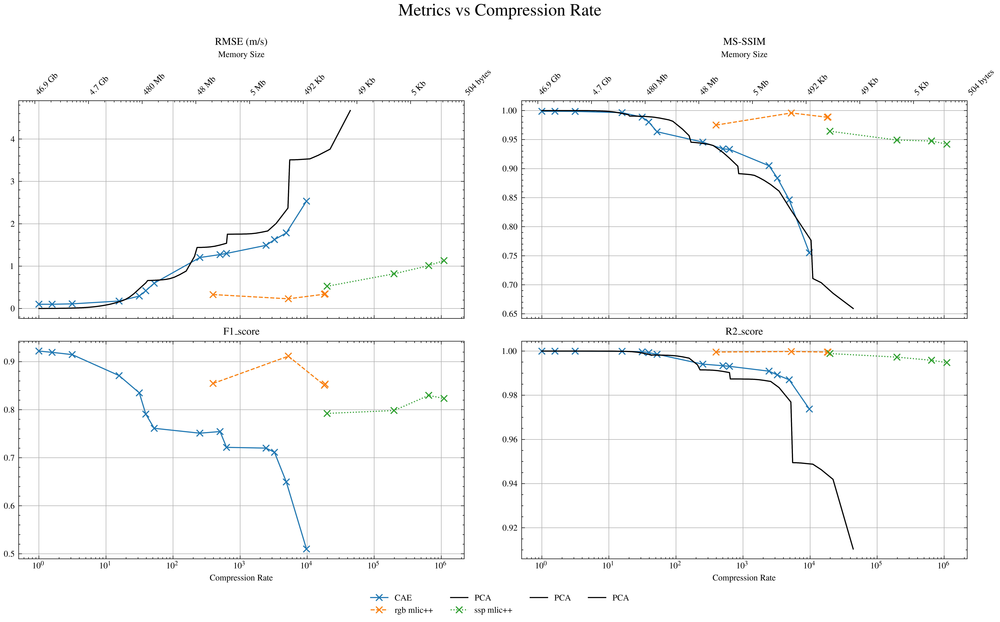

In [42]:
import numpy as np
import matplotlib.pyplot as plt

# Use science style
plt.style.use(["science", "ieee"])

# List of metrics with units
metrics = {
    "RMSE": "m/s",
    #"PSNR": "dB",
    "MS-SSIM": None,
    ##"ECS": "m",
    "F1_score": None,
    "R2_score": None
}

plot_cae = True
plot_compressai = True
plot_PCA = True
plot_filtered = True

n_metrics = len(metrics)
ncols = 2
nrows = int(np.ceil(n_metrics / ncols))

model_to_exclude = ["MLIC++ RGB", 'MLIC++ original']
pca_to_exclude = []

models = sorted([m for m in model_metrics.keys() if m not in model_to_exclude])
pca_models = sorted([m for m in pca_rmse_dict.keys() if m not in pca_to_exclude])
# Calculate the number of legend rows based on total entries and columns
total_legend_entries = len(models + pca_models) 
ncol = 4  # Legend columns
legend_rows = int(np.ceil(total_legend_entries / ncol))

# Add extra height for legend rows (0.4 inches per legend row)
extra_height_for_legend = 0.6 * legend_rows

# Adjust figure height to account for legend rows
fig, axes = plt.subplots(nrows, ncols, figsize=(13, 3.8 * nrows + extra_height_for_legend), sharex=True)
axes = axes.flatten()




# Sort models alphabetically for consistent coloring


# Use a qualitative colormap with enough distinct colors
colors = plt.cm.tab10.colors if len(models) <= 10 else plt.cm.tab20.colors

# Collect handles and labels for the legend
handles, labels = [], []

# # Use available models from the selected season
# models = ['CAE',
#  'CAE pooled by factor 4x4',
#  'CAE pooled by factor 8x8',
#  'ssp mlic++',
#  'rgb mlic++']

# seasoned_pca_models = ['depth',
#                        'depth_spatial_time'] #'spatial', 'time', 'depth_spatial', 'depth_time', 'spatial_time',

# pooled_pca = [ 'PCA',
#  'PCA pooled by factor 4x4', 
#  'PCA pooled by factor 8x8', ]
 

# Filter models to only include those available in the selected season
#models = [model for model in models if model in season_model_metrics]

# Plot each metric
for idx, (metric, unit) in enumerate(metrics.items()):
    ax = axes[idx]
    filtered_lines = []
    filtered_labels = []

    # Plot model data
    for i, model in enumerate(models):
        cr_values = sorted(model_metrics[model].keys())
        x = cr_values
        # --- Add Filtered_F1_score if metric is F1_score ---
        if metric == "F1_score" and plot_filtered:
            y_filt = [model_metrics[model][cr].get("Filtered_F1_score", np.nan) for cr in x]
            filt_line, = ax.plot(
                x, y_filt,
                label=f"{model} (filtered)",
                marker='x',#'x',
                color=colors[i % len(colors)],
                alpha=1,#0.55,
                #linestyle='-', #:
                #markersize=7
            )
            filtered_lines.append(filt_line)
            filtered_labels.append(f"{model} (filtered)")

            continue
            
        #if (plot_cae and model.startswith("CAE")) or (plot_compressai and not model.startswith("CAE")):

        y = [model_metrics[model][cr][metric] for cr in x]
        line, = ax.plot(x, y, label=model, marker='x', color=colors[i % len(colors)])
        if idx == 0:  # Collect legend items only once
            if "cutted_" in model:
                model_name = model.split("cutted_")[1]
                model_name = model_name.replace("RGB","*").replace("original","**")
            else:
                model_name = model
            handles.append(line)
            labels.append(model_name)



    # Add PCA data to the plots
        all_points = []
        for pca_name, cr_dict in pca_rmse_dict.items():
            for cr, metrics_dict in cr_dict.items():
                if metric in metrics_dict:
                    try:
                        all_points.append((float(cr), float(metrics_dict[metric])))
                    except Exception:
                        pass

        if all_points:
            pareto_points = filter_pareto(all_points, metric_name=metric)
            if pareto_points:
                crs = [float(p[0]) for p in pareto_points]
                rms = [float(p[1]) for p in pareto_points]
                pareto_line, = ax.plot(
                    crs,
                    rms,
                    linestyle='-',
                    #marker='x',
                    color='k',
                    markersize=2,
                    label='PCA'
                )
                # add to global legend handles/labels (only once)
                if idx == 0:
                    handles.append(pareto_line)
                    labels.append('PCA')

    ax.set_xscale("log")
    title = f"{metric} ({unit})" if unit else metric
    ax.set_title(title)
    ax.grid(True)
    if metric == "PSNR":
        ax.set_ylim(top=50)
    
    # Add primary x-axis label only for bottom row
    if idx // ncols == nrows - 1:
        ax.set_xlabel("Compression Rate")
    
    # Add secondary x-axis with memory size for bottom row subplots
    if idx // ncols == 0:
        # Create secondary x-axis
        ax2 = ax.twiny()
        ax2.set_xscale("log")
        ax2.set_xlim(ax.get_xlim())
        
        # Get current ticks and convert to memory sizes
        cr_ticks = ax.get_xticks()
        memory_labels = [cr_to_memory_size(cr) for cr in cr_ticks if cr >=1]
        
        # Set the ticks and labels for secondary axis
        ax2.set_xticks(cr_ticks[cr_ticks >=1])
        ax2.set_xticklabels(memory_labels, rotation=45, ha='left')
        ax2.set_xlabel("Memory Size", labelpad=10)
        
        # Style the secondary axis
        ax2.tick_params(axis='x', which='major', labelsize=8)

    # # Add legend for filtered lines only in F1_score subplot
    # if metric == "F1_score" and filtered_lines:
    #     ax.legend(filtered_lines, filtered_labels, loc="lower left", fontsize=6.5, frameon=True)

# Hide unused subplots (if any)
for j in range(n_metrics, len(axes)):
    fig.delaxes(axes[j])

# Sort and zip handles and labels
sorted_handles_labels = sorted(zip(labels, handles), key=lambda x: x[0])  # Sort by label alphabetically

# Parameters for legend layout
nrow = 1
ncol = 4

labels = np.array(sorted_handles_labels)[:,0]
handles = np.array(sorted_handles_labels)[:,1]

handles_reordered = reorder_rowwise(list(handles), ncol)
labels_reordered = reorder_rowwise(list(labels), ncol)

bottom_margin = 0.03 + 0.03 * legend_rows

fig.suptitle(f"Metrics vs Compression Rate", fontsize=16, y=0.95)
fig.tight_layout(rect=[0, bottom_margin, 1, 0.95])

# Keep the global legend for all curves, sorted by name
fig.legend(
    handles_reordered, 
    labels_reordered, 
    loc='lower center',
    ncol=ncol,
    bbox_to_anchor=(0.5, bottom_margin/2)  # Adjust anchor point based on margin
)

plt.show()

{'RMSE': np.float64(3.5058957561349615),
 'PSNR': np.float64(-10.895979973841115),
 'MS-SSIM': 0.7214810901213162,
 'ECS': np.float64(66.3049343729576),
 'MAE': np.float64(1.7808017215346161),
 'mean_error_n_min_max': np.float64(0.7415846203346204),
 'F1_score': np.float64(0.6298290086397886),
 'Filtered_F1_score': nan,
 'R2_score': np.float64(0.9495556976546458)}

In [32]:
list(model_metrics['ssp mlic++'].keys())

[197516.6525213176,
 649211.7824671833,
 15934.101168950556,
 322223.0359677671,
 563298.3886731141,
 644685.3760015965,
 1097611.5207099759,
 993615.2785091262,
 841130.7326046389,
 653913.6049812353,
 348964.59898241324,
 269623.79965086264,
 316573.15976661956,
 42658.58470133713,
 19835.272836731958]

In [28]:
np.sort(list(model_metrics['ssp mlic++'].keys()))

array([  15934.10116895,   19835.27283673,   42658.58470134,
        197516.65252132,  269623.79965086,  316573.15976662,
        322223.03596777,  348964.59898241,  563298.38867311,
        644685.3760016 ,  649211.78246718,  653913.60498124,
        841130.73260464,  993615.27850913, 1097611.52070998])

In [ ]:
del model_metrics['ssp mlic++'][15934.101168950556]

In [ ]:
[19835.272836731958,197516.6525213176,649211.7824671833,1097611.5207099759]

In [36]:
model_metrics['ssp mlic++'][197516.6525213176]

{'RMSE': np.float64(0.8189580691541684),
 'PSNR': np.float64(1.7347666730002989),
 'MS-SSIM': 0.9492124788055661,
 'ECS': np.float64(44.594306483757734),
 'MAE': np.float64(0.4312102544075931),
 'mean_error_n_min_max': np.float64(2.0957585263835266),
 'F1_score': np.float64(0.7518976945792412),
 'Filtered_F1_score': np.float64(0.7983143633033339),
 'R2_score': np.float64(0.9972553697250934)}

In [43]:
def legend_priority(label):
    if label == "PCA":
        return (0, 0)   # first group, first position
    if label == "CAE":
        return (0, 1)   # first group, second position
    if label.startswith("MLIC++"):
        return (1, label)  # second group, alphabetical inside group
    return (2, label)  # everything else after

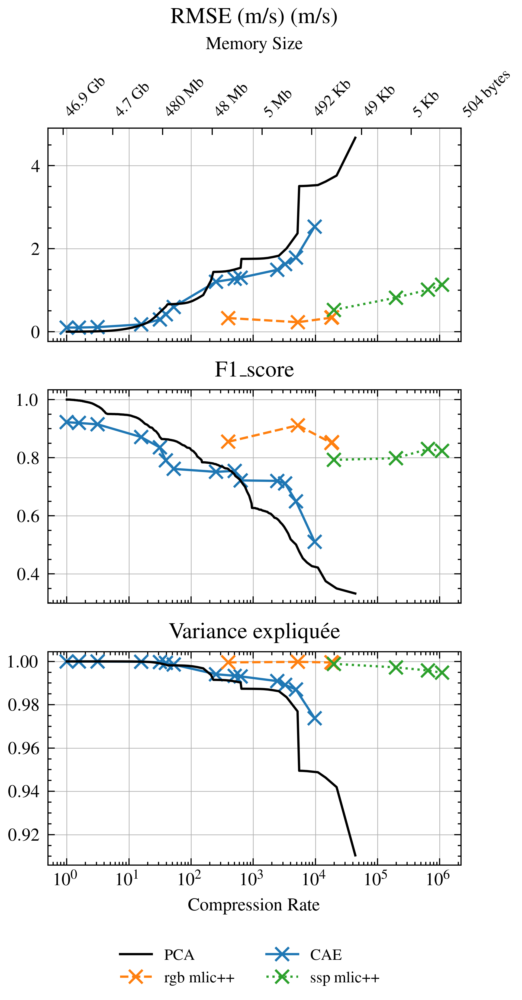

In [48]:
import numpy as np
from matplotlib.lines import Line2D

import matplotlib.pyplot as plt

plt.style.use(["science", "ieee"])

# Keep only selected metrics
metrics = {
    "RMSE": "m/s",
    "F1_score": None,
    "R2_score": None
}

plot_cae = True
plot_compressai = True
plot_PCA = True
plot_filtered = True

n_metrics = len(metrics)
ncols = 1
nrows = n_metrics

# Exclusions
model_to_exclude = ["MLIC++ RGB", "MLIC++ original"]
pca_to_exclude = []

models = sorted([m for m in model_metrics.keys() if m not in model_to_exclude])
pca_models = sorted([m for m in pca_rmse_dict.keys() if m not in pca_to_exclude])

# Legend rows
total_legend_entries = len(models + pca_models) 
ncol = 3
legend_rows = int(np.ceil(total_legend_entries / ncol))
extra_height_for_legend = 0.25 * legend_rows  # keep tight

# IEEE figure size: 8.5 cm = 3.35 in
fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(3.35, 2.0 * nrows + extra_height_for_legend),
    sharex=True
)
axes = np.atleast_1d(axes).flatten()

colors = plt.cm.tab10.colors if len(models) <= 10 else plt.cm.tab20.colors
handles, labels = [], []

for idx, (metric, unit) in enumerate(metrics.items()):
    ax = axes[idx]

    title = "Variance expliquée" if metric == "R2_score" else (f"{metric} ({unit})" if unit else metric)
    ax.set_title(title, fontsize=10)

    for i, model in enumerate(models):
        cr_values = sorted(model_metrics[model].keys())

        if metric == "F1_score" and plot_filtered:
            y_filt = [model_metrics[model][cr].get("Filtered_F1_score", np.nan) for cr in cr_values]
            ax.plot(
                cr_values, y_filt,
                label=f"{model} (filtered)",
                marker="x",
                color=colors[i % len(colors)],
            )
            continue

        y = [model_metrics[model][cr][metric] for cr in cr_values]
        line, = ax.plot(
            cr_values, y,
            label=model,
            marker="x",
            color=colors[i % len(colors)]
        )
        if idx == 0:
            handles.append(line)
            labels.append(model.replace("SSP","**") if "cutted_" not in model else ((model.split("cutted_")[1]).replace("RGB","*").replace('original','')))

    if plot_PCA:
        # build all points from PCA dict: (cr, rmse)
        all_points = []
        for pca_name, cr_dict in pca_rmse_dict.items():
            for cr, metrics_dict in cr_dict.items():
                if metric in metrics_dict:
                    try:
                        all_points.append((float(cr), float(metrics_dict[metric])))
                    except Exception:
                        pass

        if all_points:
            pareto_points = filter_pareto(all_points, metric_name=metric)
            if pareto_points:
                crs = [float(p[0]) for p in pareto_points]
                rms = [float(p[1]) for p in pareto_points]
                pareto_line, = ax.plot(
                    crs,
                    rms,
                    linestyle='-',
                    #marker='x',
                    color='k',
                    markersize=2,
                    label='PCA'
                )
                # add to global legend handles/labels (only once)
                if idx == 0:
                    handles.append(pareto_line)
                    labels.append('PCA')

    ax.set_xscale("log")
    ax.set_title(f"{title} ({unit})" if unit else title, fontsize=10)
    ax.grid(True, linewidth=0.3)

    # Only bottom subplot gets x-axis label
    if idx == nrows - 1:
        ax.set_xlabel("Compression Rate")

    # Secondary x-axis (memory size) only on first subplot
    if idx == 0:
        ax2 = ax.twiny()
        ax2.set_xscale("log")
        ax2.set_xlim(ax.get_xlim())
        cr_ticks = ax.get_xticks()
        memory_labels = [cr_to_memory_size(cr) for cr in cr_ticks if cr >= 1]
        ax2.set_xticks(cr_ticks[cr_ticks >= 1])
        ax2.set_xticklabels(memory_labels, rotation=45, ha="left")
        ax2.set_xlabel("Memory Size", labelpad=8)
        ax2.tick_params(axis="x", which="major", labelsize=7)

# Legend
sorted_handles_labels = sorted(zip(labels, handles), key=lambda x: legend_priority(x[0]))
labels = list(np.array(sorted_handles_labels)[:, 0])
handles = list(np.array(sorted_handles_labels)[:, 1])

# Insert an empty handle+label at 3rd position (index 2)
empty_handle = Line2D([], [], linestyle='None')  # invisible handle
insert_idx = 2
handles.insert(insert_idx, empty_handle)
labels.insert(insert_idx, " ")  # small blank label (use "" if you prefer fully empty)

handles_reordered = reorder_rowwise(handles, ncol)
labels_reordered = reorder_rowwise(labels, ncol)



bottom_margin = 0. + 0.04 * legend_rows

fig.tight_layout(rect=[0, bottom_margin, 1, 0.98])
fig.legend(
    handles_reordered,
    labels_reordered,
    loc="lower center",
    ncol=ncol,
    fontsize=7,
    bbox_to_anchor=(0.55, bottom_margin/2)
)

plt.show()

In [ ]:
metric="R2_score"
all_points = []
for pca_name, cr_dict in pca_rmse_dict.items():
    for cr, metrics_dict in cr_dict.items():
        if metric in metrics_dict:

            all_points.append((float(cr), float(metrics_dict[metric])))
         
all_points

[(157.0, 0.9513993060890586),
 (78.5, 0.9878806580100112),
 (52.333333333333336, 0.9954391864237249),
 (39.25, 0.9985008031603476),
 (31.4, 0.9991112439389354),
 (26.166666666666668, 0.9994964473988693),
 (22.428571428571427, 0.9997023494116318),
 (19.625, 0.9998087403601319),
 (17.444444444444443, 0.9998634504544827),
 (15.7, 0.9998965654515412),
 (14.272727272727273, 0.9999189033372156),
 (13.083333333333334, 0.9999381529204939),
 (12.076923076923077, 0.9999514044832266),
 (11.214285714285714, 0.9999613713486065),
 (10.466666666666667, 0.9999686411527138),
 (9.8125, 0.9999743764339359),
 (9.235294117647058, 0.9999787881371249),
 (8.722222222222221, 0.9999824929605303),
 (8.263157894736842, 0.9999854032074458),
 (7.85, 0.9999877599571634),
 (7.476190476190476, 0.9999897055561217),
 (7.136363636363637, 0.9999913046916404),
 (6.826086956521739, 0.9999926142165522),
 (6.541666666666667, 0.9999936831122007),
 (6.28, 0.9999945626195862),
 (6.038461538461538, 0.9999953071168303),
 (5.814814

In [ ]:
model_metrics['CAE'][4884.444444444444]

{'RMSE': np.float64(1.777923177983763),
 'PSNR': 31.45806397427426,
 'MS-SSIM': 0.8470911097953575,
 'ECS': np.float64(65.75817545290339),
 'MAE': np.float64(1.0026888660841529),
 'mean_error_n_min_max': np.float64(9.118319658944658),
 'F1_score': np.float64(0.5592332638235513),
 'Filtered_F1_score': np.float64(0.6497437118530869),
 'R2_score': np.float64(0.9870270093225538)}

In [ ]:
model_metrics['cutted_MLIC++ original']

{395.9559278134397: {'RMSE': np.float64(0.32859676170411184),
  'PSNR': 46.123058224135804,
  'MS-SSIM': 0.9749995014414348,
  'ECS': np.float64(32.71121085236846),
  'MAE': np.float64(0.23674625666135907),
  'mean_error_n_min_max': np.float64(38.462203185328185),
  'F1_score': np.float64(0.5037193497306319),
  'Filtered_F1_score': np.float64(0.8550120139793889),
  'R2_score': np.float64(0.999558137571412)}}

In [ ]:
model_metrics['cutted_MLIC++ RGB']

{5248.767860301394: {'RMSE': np.float64(0.22842502913466636),
  'PSNR': 49.28145002823666,
  'MS-SSIM': 0.9958940795416074,
  'ECS': np.float64(25.170512110398),
  'MAE': np.float64(0.14909290082755788),
  'mean_error_n_min_max': np.float64(13.494077380952382),
  'F1_score': np.float64(0.6641407735207406),
  'Filtered_F1_score': np.float64(0.9113885542480606),
  'R2_score': np.float64(0.9997864754108935)}}

In [ ]:
model_metrics['MLIC++ SSP']

{19832.120467413566: {'RMSE': np.float64(0.5230424957171409),
  'PSNR': 42.08558429788496,
  'MS-SSIM': 0.9645100473445534,
  'ECS': np.float64(43.30350293431804),
  'MAE': np.float64(0.3242542033004434),
  'mean_error_n_min_max': np.float64(29.369651705276706),
  'F1_score': np.float64(0.5605518037383376),
  'Filtered_F1_score': np.float64(0.7923226436043083),
  'R2_score': np.float64(0.9988772370481876)},
 360288.7695172972: {'RMSE': np.float64(0.8209895337008961),
  'PSNR': 38.16957139582205,
  'MS-SSIM': 0.9443267414925225,
  'ECS': np.float64(47.75875470384945),
  'MAE': np.float64(0.47950177619300843),
  'mean_error_n_min_max': np.float64(24.535140765765767),
  'F1_score': np.float64(0.5811342082431984),
  'Filtered_F1_score': np.float64(0.7480579695340724),
  'R2_score': np.float64(0.9972337631408845)},
 42659.057731425535: {'RMSE': np.float64(0.6746929410134569),
  'PSNR': 39.87420048045114,
  'MS-SSIM': 0.9618389830914024,
  'ECS': np.float64(47.170586635085634),
  'MAE': np.f

In [ ]:
#pca_rmse_dict['PCA pooled by factor 16x16'][5495.] 
pca_rmse_dict['PCA pooled by factor 8x8'][5171.764705882353]

{'RMSE': np.float64(2.370290616966071),
 'PSNR': np.float64(-7.496031946421512),
 'MS-SSIM': 0.8289497464863014,
 'ECS': np.float64(110.61250289186768),
 'MAE': np.float64(1.532576093951212),
 'mean_error_n_min_max': np.float64(1.517992277992278),
 'F1_score': np.float64(0.38402250257952575),
 'Filtered_F1_score': nan,
 'R2_score': np.float64(0.9769422292309131)}

In [ ]:
model_outputs_best_worst.keys()

dict_keys(['MLIC++ SSP', 'MLIC++ RGB', 'MLIC++ original', 'CAE'])

In [ ]:



rmse = np.sqrt(np.mean((pca_results[layer]['arr'] - unorm_ssp_arr_3D(dm_cae.test_da.data, dm_cae))**2))
print(f"RMSE between PCA reconstruction (layer={layer}) and ground truth: {rmse:.4f}")

NameError: name 'pca_results' is not defined

In [ ]:
model_outputs_best_worst["CAE"][4884.444444444444]['RMSE']['worst']['t_lat_lon']

((np.int64(15), np.int64(101), np.int64(81)),
 array([1514.14196931, 1514.15830612, 1514.17692363, 1514.1960095 ,
        1514.20508089, 1514.20008747, 1514.19057207, 1514.17813631,
        1514.16104116, 1514.13488971, 1514.090798  , 1514.01144303,
        1513.87107536, 1513.63183847, 1513.20470406, 1512.47290268,
        1511.47979017, 1510.53163513, 1509.7331558 , 1509.08997155,
        1508.57116866, 1508.14570377, 1507.79008724, 1507.48389487,
        1507.21055787, 1506.95583865, 1506.71433821, 1506.48391506,
        1506.25914667, 1506.03929899, 1505.83006506, 1505.64202504,
        1505.48421708, 1505.36473812, 1505.2686042 , 1505.1832809 ,
        1505.1000253 , 1505.01319943, 1504.92765338, 1504.85672345,
        1504.80310201, 1504.74111683, 1504.65562946, 1504.53856492,
        1504.40757167, 1504.28058709, 1504.13777706, 1503.99227943,
        1503.85132619, 1503.71207406, 1503.56637374, 1503.40844464,
        1503.23345355, 1503.03276736, 1502.79228824, 1502.494375  ,
  

Fitting PCA on train data
Computing PCA reconstruction with 0 pooling layers
  Layer 0: Compression rate = 78.50
Computing PCA reconstruction with 1 pooling layers
  Layer 1: Compression rate = 314.00
Computing PCA reconstruction with 2 pooling layers
  Layer 2: Compression rate = 1256.00
Computing PCA reconstruction with 3 pooling layers
  Layer 3: Compression rate = 4884.44


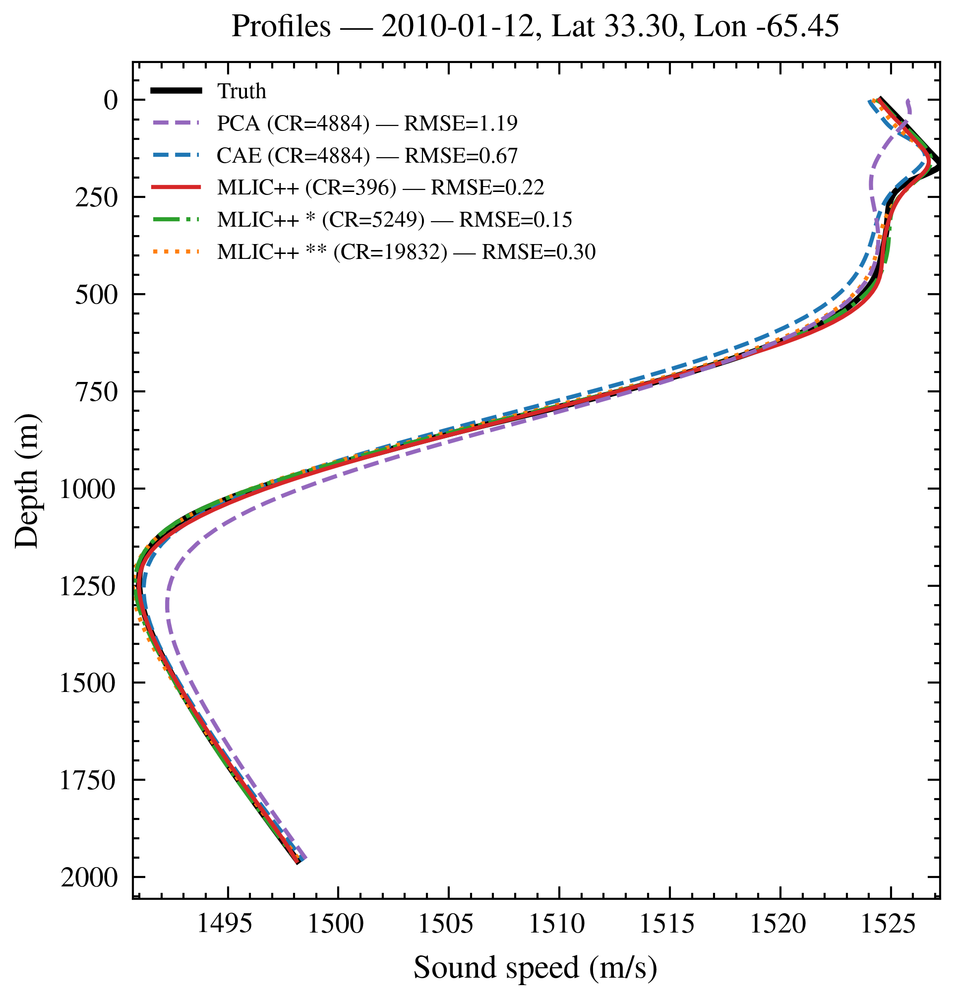

In [ ]:

# Overlay single figure: truth + all models
models = [
    ("CAE", 4884.444444444444),
    ("MLIC++ SSP", 19832.120467413566),
    ("MLIC++ RGB", None),
    ("MLIC++ original", None)
]

profiles = []
meta = []
truth_profile = None
truth_meta = None

# option: if True, replace model profile by a low-pass filtered profile (only for non-PCA models)
plot_filtered_profiles = True
_butter_N = 2
_butter_Wn = 0.107

plot_pca = True
layer = 3
n_components = 2

time_idx, lat_idx, lon_idx = model_outputs_best_worst["CAE"][1.0]['selected']['t_lat_lon'][0]
truth_1d = model_outputs_best_worst["CAE"][1.0]['selected']['t_lat_lon'][1].squeeze()


if plot_pca:
    pca_results, pca = compute_pca_reconstructions(dm_cae, n_components, device, max_layers=layer)
    pca_recon = pca_results[layer]['arr'][time_idx, :, lat_idx, lon_idx]
    pca_cr = pca_results[layer]['CR']
    model = f"PCA" #pooled by factor {2**layer}x{2**layer}
    models.append((model,pca_cr))
    model_outputs_best_worst[model] = {
        pca_cr: {
            'selected': {
                't_lat_lon': (_,_, pca_recon)
            }
        }
    }


# Color cycle for models (skip black since it's reserved for truth)
color_cycle = plt.cm.tab10.colors

for i, (model, cr) in enumerate(models):
    if cr is None:
        cr = list(model_outputs_best_worst[model].keys())[0]

    sel = model_outputs_best_worst[model][cr]['selected']['t_lat_lon']
    #truth_1d = np.asarray(sel[1]).squeeze()
    model_1d = np.asarray(sel[2]).squeeze()
    #time_idx, lat_idx, lon_idx = sel[0]

    # Fix possible shape mismatch
    if truth_1d.shape != model_1d.shape:
        if truth_1d.T.shape == model_1d.shape:
            truth_1d = truth_1d.T
        elif model_1d.T.shape == truth_1d.shape:
            model_1d = model_1d.T
        else:
            raise ValueError(
                f"Shape mismatch model {model_1d.shape} vs truth {truth_1d.shape} for {model} CR={cr}"
            )

    if truth_profile is None:
        # Cut last depth point for truth
        truth_profile = truth_1d[:-1].copy()
        truth_time = dm_cae.test_da.coords['time'].values[time_idx]
        truth_lat = dm_cae.test_da.coords['lat'].values[lat_idx]
        truth_lon = dm_cae.test_da.coords['lon'].values[lon_idx]
        truth_meta = (truth_time, truth_lat, truth_lon)

    # Cut last point for both before RMSE
    model_1d = model_1d[:-1]
    truth_cut = truth_1d[:-1]

    # optionally filter model profile (only for non-PCA models)
    if plot_filtered_profiles and not str(model).startswith("PCA"):
        try:
            b, a = butter(N=_butter_N, Wn=_butter_Wn, btype='low', analog=False)
            model_plot = filtfilt(b, a, model_1d, axis=0)
        except Exception:
            # fallback to original if filtering fails
            model_plot = model_1d
    else:
        model_plot = model_1d

    rmse = np.sqrt(np.nanmean((model_plot - truth_cut) ** 2))

    depth = dm_cae.test_da.coords['z'].values[:-1]  # also drop last depth

    profiles.append(model_plot)
    meta.append((model, cr, rmse, model_plot, time_idx, lat_idx, lon_idx))


# === FIGURE ===
# IEEE single column: 8.5 cm = 3.35 in
fig, ax = plt.subplots(figsize=(3.35, 3.5))

# Plot truth in black
ax.plot(truth_profile, depth, color="k", lw=1.5, label="Truth")

# Plot models with distinct colors
for (model, cr, rmse, model_1d, *model_profile), color in zip(meta, color_cycle):
    label = f"{model.replace('original','').replace('RGB','*').replace('SSP','**')} (CR={cr:.0f}) — RMSE={rmse:.2f}"
    ax.plot(model_1d, depth, lw=1, color=color, label=label)

# Axis formatting
ax.set_xlabel("Sound speed (m/s)", fontsize=8)
ax.set_ylabel("Depth (m)", fontsize=8)
ax.invert_yaxis()

# Compact x-limits
all_x = np.hstack([truth_profile] + profiles)
ax.set_xlim(np.nanmin(all_x), np.nanmax(all_x))

# Title compact
title = (
    f"Profiles — {np.datetime_as_string(truth_meta[0], unit='D')}, "
    f"Lat {truth_meta[1]:.2f}, Lon {truth_meta[2]:.2f}"
)
ax.set_title(title, fontsize=8)

handles, labels = ax.get_legend_handles_labels()

# Normalize label head (before " (CR=...") removing spaces so "MLIC++ *" -> "MLIC++*"
def head_key(label):
    head = label.split(" (CR=")[0].strip()
    return head.replace(" ", "")

mapping = { head_key(l): (h, l) for h, l in zip(handles, labels) }

desired_order = ["Truth", "PCA", "CAE", "MLIC++", "MLIC++*", "MLIC++**"]
new_handles, new_labels = [], []

for name in desired_order:
    key = name.replace(" ", "")
    if key in mapping:
        h, l = mapping[key]
        new_handles.append(h)
        new_labels.append(l)

# append any remaining entries in original order
seen = { name.replace(" ", "") for name in desired_order }
for h, l in zip(handles, labels):
    k = head_key(l)
    if k not in seen:
        new_handles.append(h)
        new_labels.append(l)

ax.legend(
    new_handles,
    new_labels,
    fontsize=(5.5),
    loc="best",
    frameon=False,
    handlelength=2,
)

# Ticks
ax.tick_params(axis="both", labelsize=7)

plt.tight_layout()
plt.show()

In [ ]:
model.replace("original","").replace("RGB","*").replace("SSP","**")

'PCA'

In [ ]:
np.sort(list(pca_rmse_dict['PCA pooled by factor 8x8'].keys()))

array([   65.88235294,    66.30467572,    66.73244782,    67.1657754 ,
          67.6047674 ,    68.0495356 ,    68.50019478,    68.95686275,
          69.41966048,    69.88871224,    70.36414566,    70.84609186,
          71.3346856 ,    71.83006536,    72.33237351,    72.84175642,
          73.35836462,    73.88235294,    74.41388066,    74.95311168,
          75.50021468,    76.05536332,    76.61873638,    77.190518  ,
          77.77089783,    78.3600713 ,    78.95823978,    79.56561086,
          80.18239854,    80.80882353,    81.44511348,    82.09150327,
          82.74823529,    83.41555977,    84.09373505,    84.78302797,
          85.48371415,    86.19607843,    86.92041522,    87.65702891,
          88.40623429,    89.168357  ,    89.94373402,    90.73271414,
          91.53565851,    92.35294118,    93.18494966,    94.03208556,
          94.89476525,    95.77342048,    96.66849918,    97.58046615,
          98.50980392,    99.45701357,   100.42261565,   101.4071511 ,
      

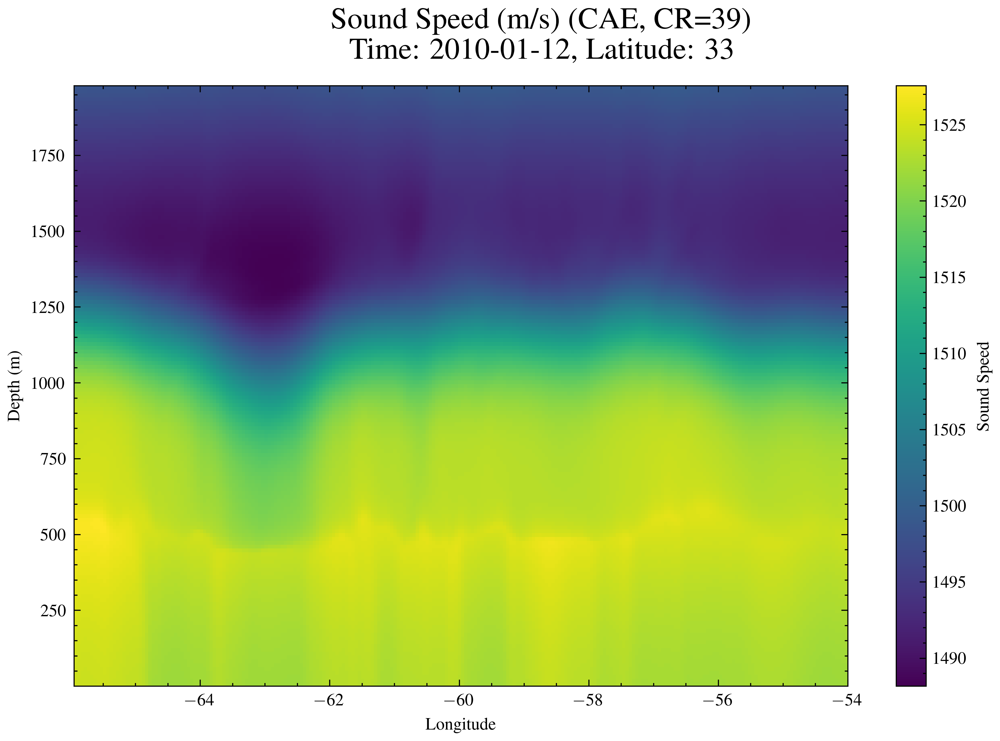

In [ ]:
# Extract the 2D array, indices, and coordinate values

model = "CAE"
cr = 39.25

sound_speed_2d = model_outputs_best_worst[model][cr]['selected']['t_lat'][1]
(time_idx, lat_idx) = model_outputs_best_worst[model][cr]['selected']['t_lat'][0]

# Get coordinate values for time and latitude
time_val = dm_cae.test_da.coords['time'].values[time_idx]
lat_val = dm_cae.test_da.coords['lat'].values[lat_idx]

# Get longitude and depth coordinates
lon = dm_cae.test_da.coords['lon'].values
depth = dm_cae.test_da.coords['z'].values

fig, ax = plt.subplots(figsize=(8, 5))
im = ax.imshow(sound_speed_2d, aspect='auto', origin='lower',
               extent=[lon.min(), lon.max(), depth.min(), depth.max()],
               cmap='viridis')

ax.set_xlabel('Longitude')
ax.set_ylabel('Depth (m)')
fig.colorbar(im, ax=ax, label='Sound Speed')

fig.suptitle(f"Sound Speed (m/s) ({model}, CR={cr:.0f})\nTime: {time_val.astype('datetime64[D]')}, Latitude: {lat_val:.0f}", fontsize=14)
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Extract selection
models = [("CAE", 39.25)]

for model, cr in models:
    truth_2d = model_outputs_best_worst[model][cr]['selected']['t_lat'][1]
    model_2d = model_outputs_best_worst[model][cr]['selected']['t_lat'][2]
    (time_idx, lat_idx) = model_outputs_best_worst[model][cr]['selected']['t_lat'][0]

# ensure shapes agree, try transpose if necessary
if truth_2d.shape != model_2d.shape:
    if truth_2d.T.shape == model_2d.shape:
        truth_2d = truth_2d.T
    else:
        raise ValueError(f"shape mismatch model {model_2d.shape} vs truth {truth_2d.shape}")

# error / absolute error and RMSE
err = model_2d - truth_2d
abs_err = np.abs(err)
rmse = np.sqrt(np.nanmean(err**2))

# coords
time_val = dm_cae.test_da.coords['time'].values[time_idx]
lat_val = dm_cae.test_da.coords['lat'].values[lat_idx]
lon = dm_cae.test_da.coords['lon'].values
depth = dm_cae.test_da.coords['z'].values

ext = [lon.min(), lon.max(), depth.min(), depth.max()]


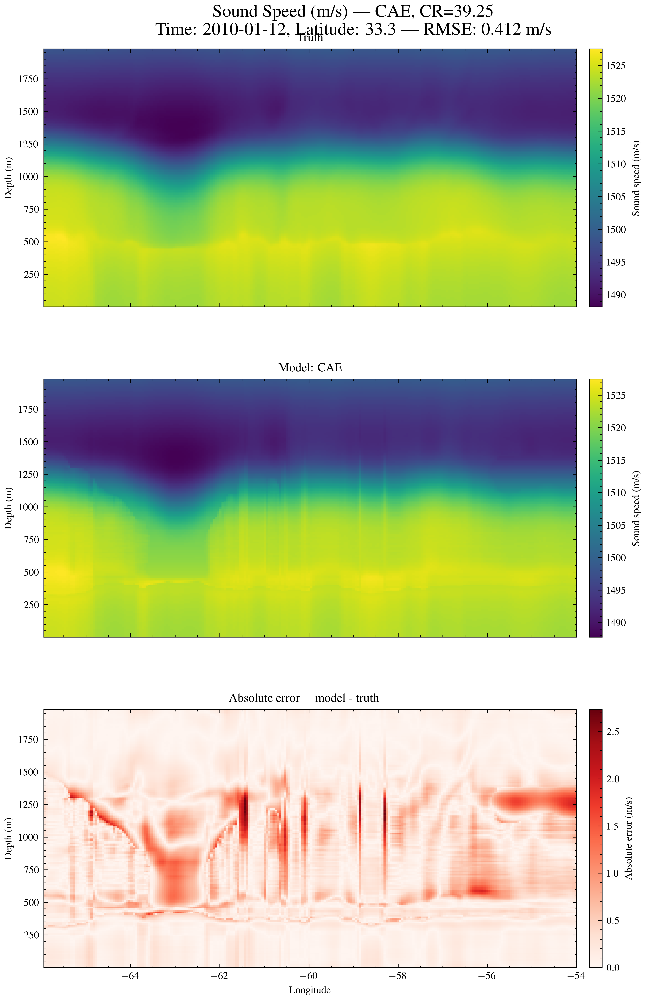

In [ ]:

# -------------------------
# Version A: one column, 3 rows (Truth / Model / Absolute error)
# -------------------------
fig, axes = plt.subplots(3, 1, figsize=(8, 12), constrained_layout=False, sharex=True)

im0 = axes[0].imshow(truth_2d, aspect='auto', origin='lower', extent=ext, cmap='viridis')
axes[0].set_title('Truth')
axes[0].set_ylabel('Depth (m)')
c0 = fig.colorbar(im0, ax=axes[0], orientation='vertical', pad=0.02)
c0.set_label('Sound speed (m/s)')

im1 = axes[1].imshow(model_2d, aspect='auto', origin='lower', extent=ext, cmap='viridis')
axes[1].set_title(f'Model: {model}')
axes[1].set_ylabel('Depth (m)')
c1 = fig.colorbar(im1, ax=axes[1], orientation='vertical', pad=0.02)
c1.set_label('Sound speed (m/s)')

vmax = np.nanmax(abs_err)
im2 = axes[2].imshow(abs_err, aspect='auto', origin='lower', extent=ext, cmap='Reds', vmin=0, vmax=vmax)
axes[2].set_title('Absolute error |model - truth|')
axes[2].set_xlabel('Longitude')
axes[2].set_ylabel('Depth (m)')
c2 = fig.colorbar(im2, ax=axes[2], orientation='vertical', pad=0.02)
c2.set_label('Absolute error (m/s)')

fig.suptitle(
    f"Sound Speed (m/s) — {model}, CR={cr}\nTime: {np.datetime_as_string(time_val, unit='D')}, Latitude: {lat_val:.1f} — RMSE: {rmse:.3f} m/s",
    fontsize=14, y=0.98
)

plt.subplots_adjust(top=0.94, hspace=0.28, left=0.08, right=0.95)
plt.show()

In [ ]:
model_outputs_best_worst.keys()

dict_keys(['MLIC++ SSP', 'MLIC++ RGB', 'MLIC++ original', 'CAE'])

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# list of (model, cr) tuples
models = [("CAE", 39.25), ("CAE",  157.0), ("16_32_0.0018", None), ('64_96_0.0018', None), ('mlicpp_on_rgb_192_320_0.025_ckpt_20250821_164209', None), ('mlicpp_on_rgb_192_320_0.025_no_ckpt_20250821_162645', None)]  # example: replace/add entries as needed

# collect abs errors and metadata
abs_errs = []
meta = []
ext = None

for model, cr in models:
    if cr==None:
        cr=list(model_outputs_best_worst[model].keys())[0]
    truth_2d = model_outputs_best_worst[model][cr]['selected']['t_lat'][1]
    model_2d = model_outputs_best_worst[model][cr]['selected']['t_lat'][2]
    (time_idx, lat_idx) = model_outputs_best_worst[model][cr]['selected']['t_lat'][0]

    # ensure shapes agree, try transpose if necessary
    if truth_2d.shape != model_2d.shape:
        if truth_2d.T.shape == model_2d.shape:
            truth_2d = truth_2d.T
        else:
            raise ValueError(f"shape mismatch model {model_2d.shape} vs truth {truth_2d.shape}")

    err = model_2d - truth_2d
    abs_err = np.abs(err)
    rmse = np.sqrt(np.nanmean(err**2))

    time_val = dm_cae.test_da.coords['time'].values[time_idx]
    lat_val = dm_cae.test_da.coords['lat'].values[lat_idx]
    lon = dm_cae.test_da.coords['lon'].values
    depth = dm_cae.test_da.coords['z'].values

    if ext is None:
        ext = [lon.min(), lon.max(), depth.min(), depth.max()]

    abs_errs.append(abs_err)
    meta.append((model, cr, rmse, time_val, lat_val))

# determine global color scale
try:
    vmax = np.nanmax([np.nanmax(a) for a in abs_errs])
    if not np.isfinite(vmax):
        vmax = 1.0
except ValueError:
    vmax = 1.0

# plot one column, n rows
nrows = len(models)
fig, axes = plt.subplots(nrows, 1, figsize=(9, 3.5 * nrows), sharex=True)
if nrows == 1:
    axes = np.array([axes])

for i, ax in enumerate(axes):
    model, cr, rmse, time_val, lat_val = meta[i]
    im = ax.imshow(abs_errs[i], aspect='auto', origin='lower', extent=ext, cmap='Reds', vmin=0, vmax=vmax)
    ax.set_ylabel('Depth (m)')
    ax.set_title(f"{model}  CR={cr}  —  RMSE: {rmse:.3f} m/s")
    ax.text(0.01, 0.02, f"Time: {np.datetime_as_string(time_val, unit='D')}, Lat: {lat_val:.1f}",
            transform=ax.transAxes, fontsize=9, va='bottom', ha='left', color='k', backgroundcolor='white', alpha=0.7)

axes[-1].set_xlabel('Longitude')

# single colorbar for all rows
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='vertical', pad=0.02, fraction=0.04)
cbar.set_label('Absolute error (m/s)')

fig.suptitle("Absolute error |model - truth| (Reds colormap)", fontsize=14, y=0.98)
plt.subplots_adjust(top=0.93, hspace=0.25, left=0.08, right=0.92)
plt.show()

KeyError: 157.0

In [ ]:
# ...existing code...
import numpy as np
import matplotlib.pyplot as plt

# list of (model, cr) tuples
models = [("CAE", 39.25), ("CAE", 157.0), ("16_32_0.0018", None),
          ("64_96_0.0018", None),
          ("mlicpp_on_rgb_192_320_0.025_ckpt_20250821_164209", None),
          ("mlicpp_on_rgb_192_320_0.025_no_ckpt_20250821_162645", None)]

arrays = []   # will store each model's reconstructed 2D array
meta = []     # (model, cr, rmse, time_val, lat_val)
ext = None
truth_ref = None
truth_time = None
truth_lat = None

for idx, (model, cr) in enumerate(models):
    if cr is None:
        cr = list(model_outputs_best_worst[model].keys())[0]
    truth_2d = model_outputs_best_worst[model][cr]['selected']['t_lat'][1]
    model_2d = model_outputs_best_worst[model][cr]['selected']['t_lat'][2]
    (time_idx, lat_idx) = model_outputs_best_worst[model][cr]['selected']['t_lat'][0]

    # ensure shapes agree, try transpose if necessary
    if truth_2d.shape != model_2d.shape:
        if truth_2d.T.shape == model_2d.shape:
            truth_2d = truth_2d.T
        else:
            raise ValueError(f"shape mismatch model {model_2d.shape} vs truth {truth_2d.shape}")

    # keep first model's truth as the reference truth to show on top row
    if truth_ref is None:
        truth_ref = truth_2d.copy()
        truth_time = dm_cae.test_da.coords['time'].values[time_idx]
        truth_lat = dm_cae.test_da.coords['lat'].values[lat_idx]

    err = model_2d - truth_2d
    rmse = np.sqrt(np.nanmean(err**2))

    time_val = dm_cae.test_da.coords['time'].values[time_idx]
    lat_val = dm_cae.test_da.coords['lat'].values[lat_idx]
    lon = dm_cae.test_da.coords['lon'].values
    depth = dm_cae.test_da.coords['z'].values

    if ext is None:
        ext = [lon.min(), lon.max(), depth.min(), depth.max()]

    arrays.append(model_2d)
    meta.append((model, cr, rmse, time_val, lat_val))

# determine global color scale across truth + models for consistent display
all_arrays = [truth_ref] + arrays
vmin = np.nanmin([np.nanmin(a) for a in all_arrays])
vmax = np.nanmax([np.nanmax(a) for a in all_arrays])

# plot: top row = truth, below rows = each model reconstruction
nrows = 1 + len(models)
fig, axes = plt.subplots(nrows, 1, figsize=(9, 3.2 * nrows), sharex=True)
if nrows == 1:
    axes = np.array([axes])

# truth (top)
im = axes[0].imshow(truth_ref, aspect='auto', origin='lower', extent=ext, cmap='viridis', vmin=vmin, vmax=vmax)
axes[0].set_title("Truth")
axes[0].set_ylabel("Depth (m)")
axes[0].text(0.01, 0.02, f"Time: {np.datetime_as_string(truth_time, unit='D')}, Lat: {truth_lat:.1f}",
             transform=axes[0].transAxes, fontsize=9, va='bottom', ha='left',
             color='k', backgroundcolor='white', alpha=0.7)

# models
for i, ax in enumerate(axes[1:], start=0):
    model, cr, rmse, time_val, lat_val = meta[i]
    im = ax.imshow(arrays[i], aspect='auto', origin='lower', extent=ext, cmap='viridis', vmin=vmin, vmax=vmax)
    ax.set_ylabel("Depth (m)")
    ax.set_title(f"{model}  CR={cr}  —  RMSE: {rmse:.3f} m/s")
    ax.text(0.01, 0.02, f"Time: {np.datetime_as_string(time_val, unit='D')}, Lat: {lat_val:.1f}",
            transform=ax.transAxes, fontsize=9, va='bottom', ha='left',
            color='k', backgroundcolor='white', alpha=0.7)

axes[-1].set_xlabel("Longitude")

# single colorbar for all rows
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='vertical', pad=0.02, fraction=0.04)
cbar.set_label('Sound speed (m/s)')

fig.suptitle("Truth (top) and model reconstructions (below)", fontsize=14, y=0.98)
plt.subplots_adjust(top=0.94, hspace=0.28, left=0.08, right=0.92)
plt.show()


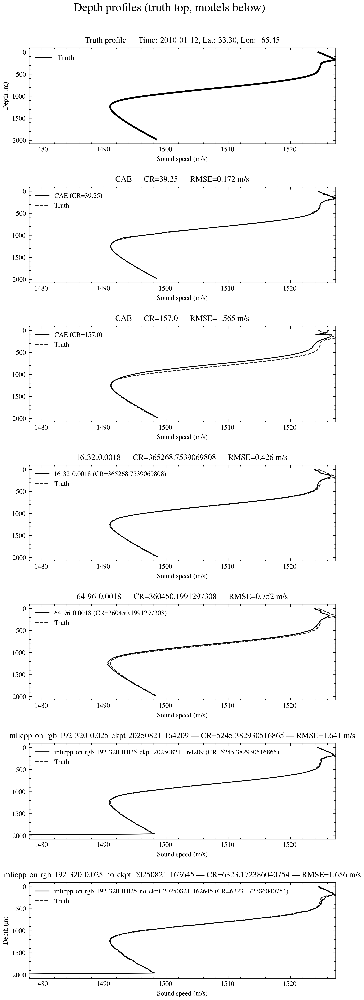

In [ ]:

# models to plot
models = [("CAE", 39.25), ("CAE", 157.0), ("16_32_0.0018", None),
          ("64_96_0.0018", None),
          ("mlicpp_on_rgb_192_320_0.025_ckpt_20250821_164209", None),
          ("mlicpp_on_rgb_192_320_0.025_no_ckpt_20250821_162645", None)]

profiles = []   # model profiles (1D arrays)
meta = []       # (model, cr, rmse, time_val, lat_val, lon_val)
truth_profile = None
truth_meta = None

for model, cr in models:
    if cr is None:
        cr = list(model_outputs_best_worst[model].keys())[0]

    # use the t_lat_lon selection (expects a depth profile)
    sel = model_outputs_best_worst[model][cr]['selected']['t_lat_lon']
    truth_1d = sel[1]
    model_1d = sel[2]
    time_idx, lat_idx, lon_idx = sel[0]

    # ensure 1D shapes agree (try transpose / squeeze)
    truth_1d = np.asarray(truth_1d).squeeze()
    model_1d = np.asarray(model_1d).squeeze()
    if truth_1d.shape != model_1d.shape:
        # try simple fixes
        if truth_1d.T.shape == model_1d.shape:
            truth_1d = truth_1d.T
        elif model_1d.T.shape == truth_1d.shape:
            model_1d = model_1d.T
        else:
            raise ValueError(f"shape mismatch model {model_1d.shape} vs truth {truth_1d.shape} for {model} CR={cr}")

    # save the first truth as global reference (top row)
    if truth_profile is None:
        truth_profile = truth_1d.copy()
        truth_time = dm_cae.test_da.coords['time'].values[time_idx]
        truth_lat = dm_cae.test_da.coords['lat'].values[lat_idx]
        truth_lon = dm_cae.test_da.coords['lon'].values[lon_idx]
        truth_meta = (truth_time, truth_lat, truth_lon)

    # compute rmse between model profile and truth at this point
    rmse = np.sqrt(np.nanmean((model_1d - truth_1d) ** 2))

    time_val = dm_cae.test_da.coords['time'].values[time_idx]
    lat_val = dm_cae.test_da.coords['lat'].values[lat_idx]
    lon_val = dm_cae.test_da.coords['lon'].values[lon_idx]
    depth = dm_cae.test_da.coords['z'].values  # depth coordinate (same for all)

    profiles.append(model_1d)
    meta.append((model, cr, rmse, time_val, lat_val, lon_val))

# plotting
nrows = 1 + len(models)   # top: truth, then one subplot per model
fig, axes = plt.subplots(nrows, 1, figsize=(6, 2.6 * nrows), sharey=True)
if nrows == 1:
    axes = np.array([axes])

# x-limits across all profiles for nicer alignment
all_x = np.hstack([truth_profile] + profiles)
xlim = (np.nanmin(all_x), np.nanmax(all_x))

# top: truth profile
ax0 = axes[0]
ax0.plot(truth_profile, depth, color='k', lw=2, label='Truth')
ax0.set_title(f"Truth profile — Time: {np.datetime_as_string(truth_meta[0], unit='D')}, "
              f"Lat: {truth_meta[1]:.2f}, Lon: {truth_meta[2]:.2f}")
ax0.set_xlabel('Sound speed (m/s)')
ax0.set_ylabel('Depth (m)')
ax0.invert_yaxis()
ax0.set_xlim(xlim)
ax0.legend(loc='best', fontsize=9)

# model rows: overlay model and truth for comparison
for i, ax in enumerate(axes[1:], start=0):
    model, cr, rmse, time_val, lat_val, lon_val = meta[i]
    model_profile = profiles[i]

    ax.plot(model_profile, depth, label=f"{model} (CR={cr})", color='C0')
    ax.plot(truth_profile, depth, label='Truth', color='k', lw=1, linestyle='--', alpha=0.9)
    ax.set_title(f"{model} — CR={cr} — RMSE={rmse:.3f} m/s")
    ax.set_xlabel('Sound speed (m/s)')
    ax.invert_yaxis()
    ax.set_xlim(xlim)
    ax.legend(fontsize=8)

axes[-1].set_ylabel('Depth (m)')  # keep ylabel on bottom for clarity (shared y)
fig.suptitle("Depth profiles (truth top, models below)", fontsize=14)
plt.subplots_adjust(hspace=0.45, left=0.12, right=0.95, top=0.94)
plt.show()

In [ ]:

truth = list(model_outputs_best_worst["mlicpp_on_rgb_192_320_0.025_ckpt_20250821_164209"].values())[0]['RMSE']["worst"]["t_lat_lon"][1]
rgb = list(model_outputs_best_worst["mlicpp_on_rgb_192_320_0.025_ckpt_20250821_164209"].values())[0]['RMSE']["worst"]["t_lat_lon"][2]
rmse = np.sqrt((rgb - truth) ** 2)

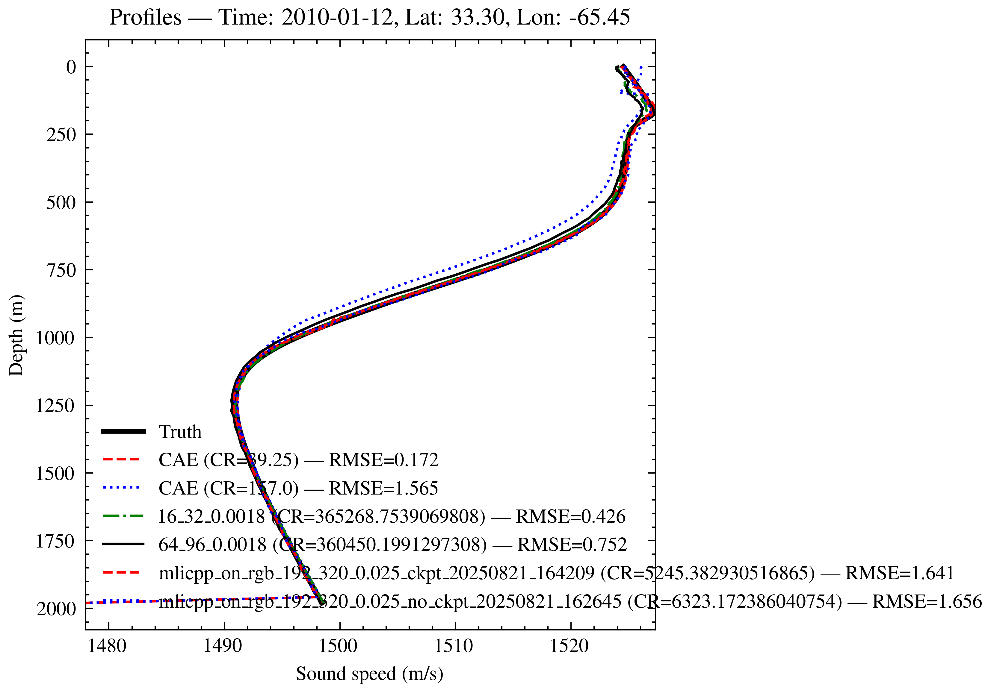

In [ ]:
# ...existing code...
import numpy as np
import matplotlib.pyplot as plt

# overlay single figure: truth + all models
models = [("CAE", 39.25), ("CAE", 157.0), ("16_32_0.0018", None),
          ("64_96_0.0018", None),
          ("mlicpp_on_rgb_192_320_0.025_ckpt_20250821_164209", None),
          ("mlicpp_on_rgb_192_320_0.025_no_ckpt_20250821_162645", None)]

profiles = []
meta = []
truth_profile = None
truth_meta = None

for model, cr in models:
    if cr is None:
        cr = list(model_outputs_best_worst[model].keys())[0]

    sel = model_outputs_best_worst[model][cr]['selected']['t_lat_lon']
    truth_1d = np.asarray(sel[1]).squeeze()
    model_1d = np.asarray(sel[2]).squeeze()
    time_idx, lat_idx, lon_idx = sel[0]

    # try simple shape fixes
    if truth_1d.shape != model_1d.shape:
        if truth_1d.T.shape == model_1d.shape:
            truth_1d = truth_1d.T
        elif model_1d.T.shape == truth_1d.shape:
            model_1d = model_1d.T
        else:
            raise ValueError(f"shape mismatch model {model_1d.shape} vs truth {truth_1d.shape} for {model} CR={cr}")

    if truth_profile is None:
        truth_profile = truth_1d.copy()
        truth_time = dm_cae.test_da.coords['time'].values[time_idx]
        truth_lat = dm_cae.test_da.coords['lat'].values[lat_idx]
        truth_lon = dm_cae.test_da.coords['lon'].values[lon_idx]
        truth_meta = (truth_time, truth_lat, truth_lon)

    rmse = np.sqrt(np.nanmean((model_1d - truth_1d) ** 2))
    depth = dm_cae.test_da.coords['z'].values

    profiles.append(model_1d)
    meta.append((model, cr, rmse, time_idx, lat_idx, lon_idx))

# single overlay figure
fig, ax = plt.subplots(figsize=(5, 4))

# plot truth
ax.plot(truth_profile, depth, color='k', lw=2, label='Truth')

# plot all models on same axes
for model_profile, (model, cr, rmse, time_idx, lat_idx, lon_idx) in zip(profiles, meta):
    label = f"{model} (CR={cr}) — RMSE={rmse:.3f}"
    ax.plot(model_profile, depth, label=label, lw=1)

# axis formatting
ax.set_xlabel('Sound speed (m/s)')
ax.set_ylabel('Depth (m)')
ax.invert_yaxis()
# set x limits from all curves
all_x = np.hstack([truth_profile] + profiles)
ax.set_xlim(np.nanmin(all_x), np.nanmax(all_x))

title = f"Profiles — Time: {np.datetime_as_string(truth_meta[0], unit='D')}, Lat: {truth_meta[1]:.2f}, Lon: {truth_meta[2]:.2f}"
ax.set_title(title)
ax.legend(loc='best', fontsize=8, ncol=1)
plt.tight_layout()
plt.show()
# ...existing code...

# Seasons

In [ ]:
# =============================================================================
# SEASON SELECTION - Change this to plot different seasons
# =============================================================================
selected_season = "winter"  # Options: 'all', 'spring', 'summer', 'autumn', 'winter'

print(f"Selected season: {selected_season}")
print(f"Available seasons in model_metrics: {list(model_metrics.keys())}")

# Extract data for the selected season
if selected_season in model_metrics:
    season_model_metrics = model_metrics[selected_season]
    print(f"Available models for {selected_season}: {list(season_model_metrics.keys())}")
else:
    print(f"Season '{selected_season}' not found in model_metrics")
    season_model_metrics = {}

# Also extract PCA data for the selected season
if selected_season in pca_all_metrics:
    season_pca_metrics = pca_all_metrics[selected_season]
    print(f"Available PCA models for {selected_season}: {list(season_pca_metrics.keys())}")
else:
    print(f"Season '{selected_season}' not found in pca_all_metrics")
    season_pca_metrics = {}

print(f"\nReady to plot metrics for {selected_season.title()} season!")
print("Run the plotting cells below to see the results.")

Selected season: winter
Available seasons in model_metrics: ['192_320_lambda0.0018', '192_320_0.0483', '640_960_0.0483', '192_320_0.025_20250820_183409', '192_320_0.025_no_gradient_accumulation_(20250821_175907)', '128_192_0.025', '640_960_0.025_1948_epochs', '640_960_0.025_20250820_182908', '1600_2400_0.0018', '16_32_0.0018', '64_96_0.0018', 'mlicpp_on_rgb_192_320_0.025_ckpt_20250821_164209', 'cutted_mlicpp_on_rgb_192_320_0.025_ckpt_20250821_164209', 'mlicpp_on_rgb_192_320_0.025_no_ckpt_20250821_162645', 'cutted_mlicpp_on_rgb_192_320_0.025_no_ckpt_20250821_162645', 'CAE', 'CAE pooled by factor 4x4', 'CAE pooled by factor 8x8']
Season 'winter' not found in model_metrics
Available PCA models for winter: ['depth', 'spatial', 'time', 'depth_spatial', 'depth_time', 'spatial_time', 'depth_spatial_time']

Ready to plot metrics for Winter season!
Run the plotting cells below to see the results.


In [ ]:
# del pca_rmse_dict["PCA pooled by factor 16>x16"]
# del pca_rmse_dict["PCA pooled by factor 2x2"]

KeyError: 'CAE'

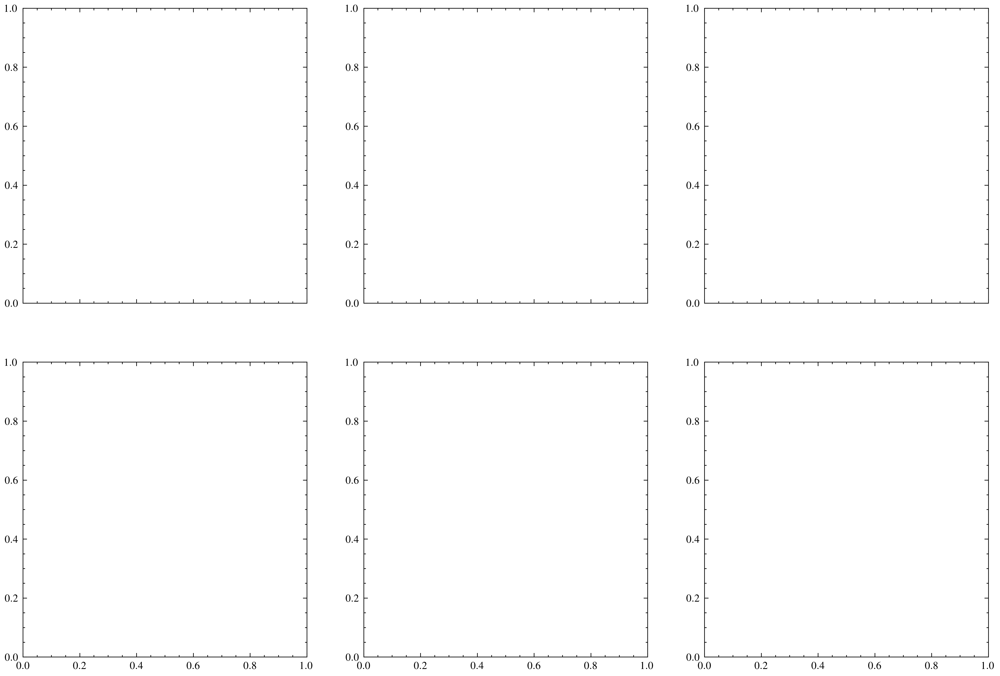

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Use science style
plt.style.use(["science", "ieee"])

# List of metrics with units
metrics = {
    "RMSE": "m/s",
    "PSNR": "dB",
    "MS-SSIM": None,
    "ECS": "m",
    "F1_score": None,
    "R2_score": None
}

plot_cae = True
plot_compressai = True
plot_PCA = True
plot_filtered = True

n_metrics = len(metrics)
ncols = 3
nrows = int(np.ceil(n_metrics / ncols))

# Calculate the number of legend rows based on total entries and columns
total_legend_entries = len(season_model_metrics) + len(season_pca_metrics)
ncol = 5  # Legend columns
legend_rows = int(np.ceil(total_legend_entries / ncol))

# Add extra height for legend rows (0.4 inches per legend row)
extra_height_for_legend = 0.6 * legend_rows

# Adjust figure height to account for legend rows
fig, axes = plt.subplots(nrows, ncols, figsize=(13, 3.8 * nrows + extra_height_for_legend), sharex=True)
axes = axes.flatten()




# Sort models alphabetically for consistent coloring
models = sorted(season_model_metrics.keys())

# Use a qualitative colormap with enough distinct colors
colors = plt.cm.tab10.colors if len(models) <= 10 else plt.cm.tab20.colors

# Collect handles and labels for the legend
handles, labels = [], []

# Use available models from the selected season
models = ['CAE',
 'CAE pooled by factor 4x4',
 'CAE pooled by factor 8x8',
 'ssp mlic++',
 'rgb mlic++']

seasoned_pca_models = ['depth',
                       'depth_spatial_time'] #'spatial', 'time', 'depth_spatial', 'depth_time', 'spatial_time',

pooled_pca = [ 'PCA',
 'PCA pooled by factor 4x4', 
 'PCA pooled by factor 8x8', ]
 

# Filter models to only include those available in the selected season
#models = [model for model in models if model in season_model_metrics]

# Plot each metric
for idx, (metric, unit) in enumerate(metrics.items()):
    ax = axes[idx]
    filtered_lines = []
    filtered_labels = []

    # Plot model data
    for i, model in enumerate(models):
        if (plot_cae and model.startswith("CAE")) or (plot_compressai and not model.startswith("CAE")):
            cr_values = sorted(season_model_metrics[model].keys())
            x = cr_values
            y = [season_model_metrics[model][cr][metric] for cr in x]
            line, = ax.plot(x, y, label=model, marker='o', color=colors[i % len(colors)])
            if idx == 0:  # Collect legend items only once
                handles.append(line)
                labels.append(model)

        # --- Add Filtered_F1_score if metric is F1_score ---
        if metric == "F1_score" and plot_filtered:
            y_filt = [season_model_metrics[model][cr].get("Filtered_F1_score", np.nan) for cr in x]
            filt_line, = ax.plot(
                x, y_filt,
                label=f"{model} (filtered)",
                marker='x',
                color=colors[i % len(colors)],
                alpha=0.55,
                linestyle=':',
                markersize=7
            )
            filtered_lines.append(filt_line)
            filtered_labels.append(f"{model} (filtered)")

    # Add PCA data to the plots
    if plot_PCA:
        for pca_model in seasoned_pca_models:
            cr_season_pca_metrics = {}

            for val in season_pca_metrics[pca_model].values():
                cr_value = val['CR']
                cr_season_pca_metrics[cr_value] = val

            cr_values = list(cr_season_pca_metrics.keys())
            y_values = [cr_season_pca_metrics[cr][metric] for cr in cr_values]
            label = pca_model.replace("_", " ")
            line, = ax.plot(cr_values, y_values, label=label, linestyle="--", marker='.')
            if idx == 0:
                handles.append(line)
                labels.append(label)

    ax.set_xscale("log")
    title = f"{metric} ({unit})" if unit else metric
    ax.set_title(title)
    ax.grid(True)
    if metric == "PSNR":
        ax.set_ylim(top=50)
    
    # Add primary x-axis label only for bottom row
    if idx // ncols == nrows - 1:
        ax.set_xlabel("Compression Rate")
    
    # Add secondary x-axis with memory size for bottom row subplots
    if idx // ncols == 0:
        # Create secondary x-axis
        ax2 = ax.twiny()
        ax2.set_xscale("log")
        ax2.set_xlim(ax.get_xlim())
        
        # Get current ticks and convert to memory sizes
        cr_ticks = ax.get_xticks()
        memory_labels = [cr_to_memory_size(cr) for cr in cr_ticks if cr >=1]
        
        # Set the ticks and labels for secondary axis
        ax2.set_xticks(cr_ticks[cr_ticks >=1])
        ax2.set_xticklabels(memory_labels, rotation=45, ha='left')
        ax2.set_xlabel("Memory Size", labelpad=10)
        
        # Style the secondary axis
        ax2.tick_params(axis='x', which='major', labelsize=8)

    # Add legend for filtered lines only in F1_score subplot
    if metric == "F1_score" and filtered_lines:
        ax.legend(filtered_lines, filtered_labels, loc="lower left", fontsize=6.5, frameon=True)

# Hide unused subplots (if any)
for j in range(n_metrics, len(axes)):
    fig.delaxes(axes[j])

# Sort and zip handles and labels
sorted_handles_labels = sorted(zip(labels, handles), key=lambda x: x[0])  # Sort by label alphabetically

# Parameters for legend layout
nrow = 3
ncol = 3

labels = np.array(sorted_handles_labels)[:,0]
handles = np.array(sorted_handles_labels)[:,1]

handles_reordered = reorder_rowwise(list(handles), ncol)
labels_reordered = reorder_rowwise(list(labels), ncol)

bottom_margin = 0.01 + 0.03 * legend_rows

fig.suptitle(f"Metrics vs Compression Rate - {selected_season.title()} Season", fontsize=16)
fig.tight_layout(rect=[0, bottom_margin, 1, 0.95])

# Keep the global legend for all curves, sorted by name
fig.legend(
    handles_reordered, 
    labels_reordered, 
    loc='lower center',
    ncol=ncol,
    bbox_to_anchor=(0.5, bottom_margin/2)  # Adjust anchor point based on margin
)

plt.show()


Plotting All Season
Available models for all: ['rgb mlic++', 'ssp mlic++', 'CAE', 'CAE pooled by factor 4x4', 'CAE pooled by factor 8x8']
Available PCA models for all: ['depth', 'spatial', 'time', 'depth_spatial', 'depth_time', 'spatial_time', 'depth_spatial_time']


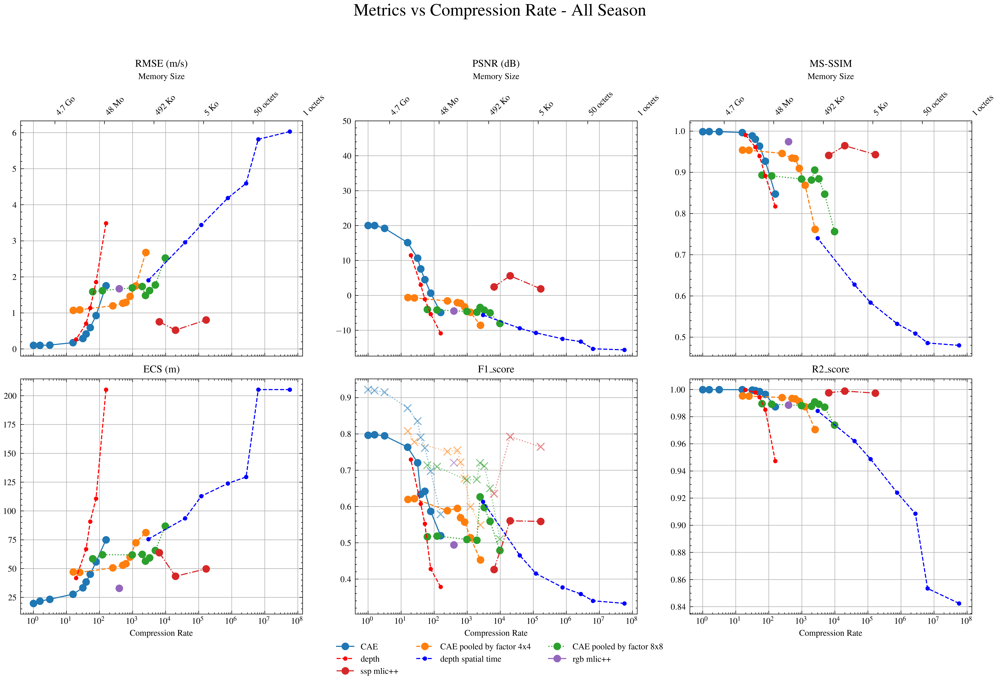


Plotting Spring Season
Available models for spring: ['rgb mlic++', 'ssp mlic++', 'CAE', 'CAE pooled by factor 4x4', 'CAE pooled by factor 8x8']
Available PCA models for spring: ['depth', 'spatial', 'time', 'depth_spatial', 'depth_time', 'spatial_time', 'depth_spatial_time']


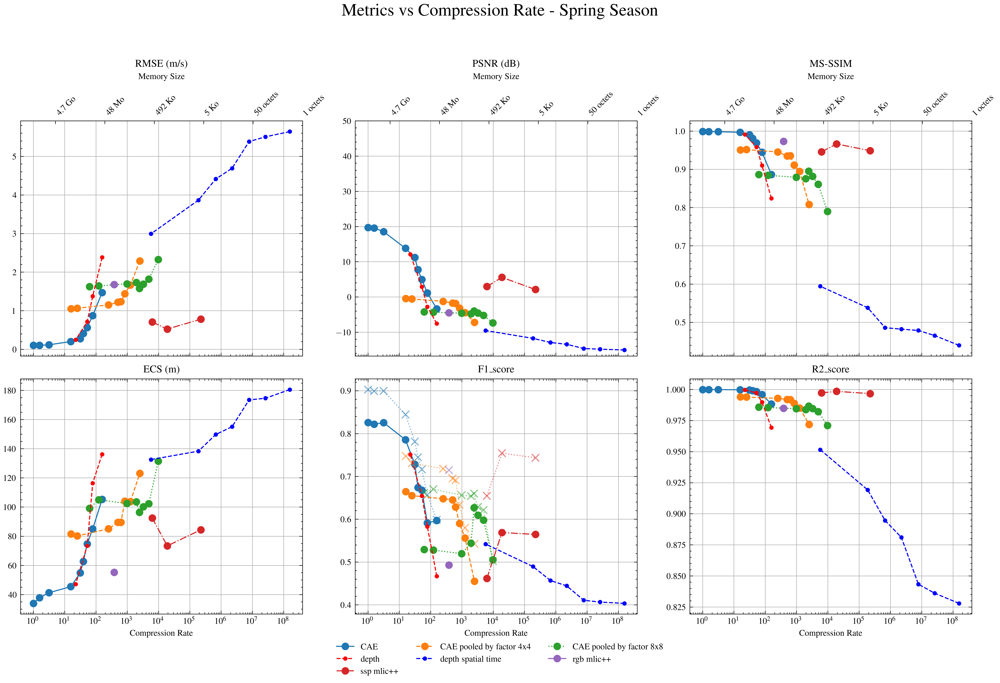


Plotting Summer Season
Available models for summer: ['rgb mlic++', 'ssp mlic++', 'CAE', 'CAE pooled by factor 4x4', 'CAE pooled by factor 8x8']
Available PCA models for summer: ['depth', 'spatial', 'time', 'depth_spatial', 'depth_time', 'spatial_time', 'depth_spatial_time']


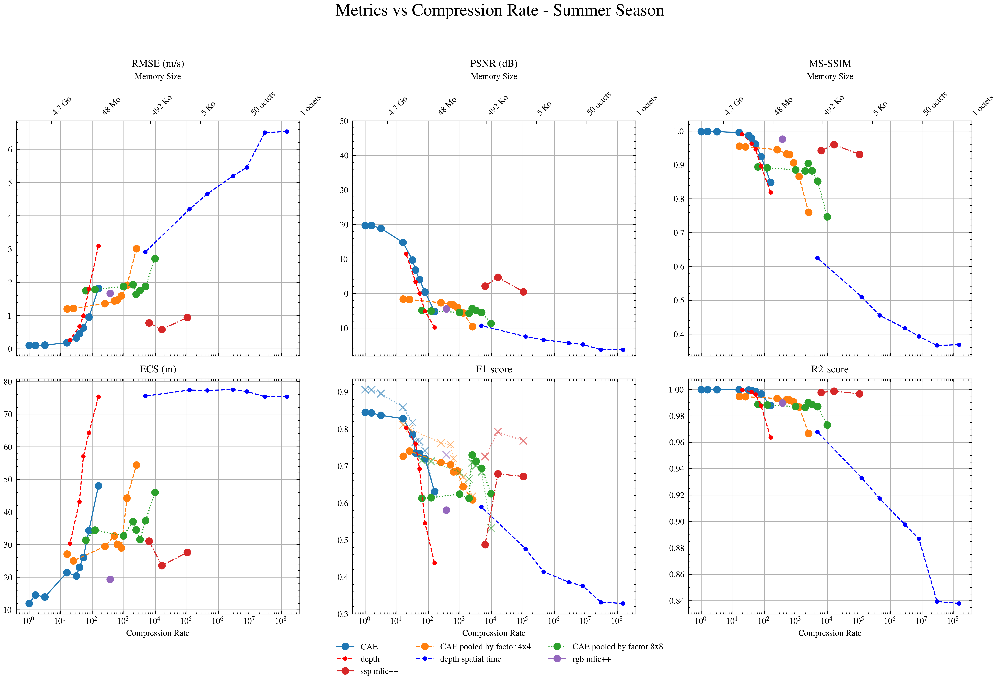


Plotting Autumn Season
Available models for autumn: ['rgb mlic++', 'ssp mlic++', 'CAE', 'CAE pooled by factor 4x4', 'CAE pooled by factor 8x8']
Available PCA models for autumn: ['depth', 'spatial', 'time', 'depth_spatial', 'depth_time', 'spatial_time', 'depth_spatial_time']


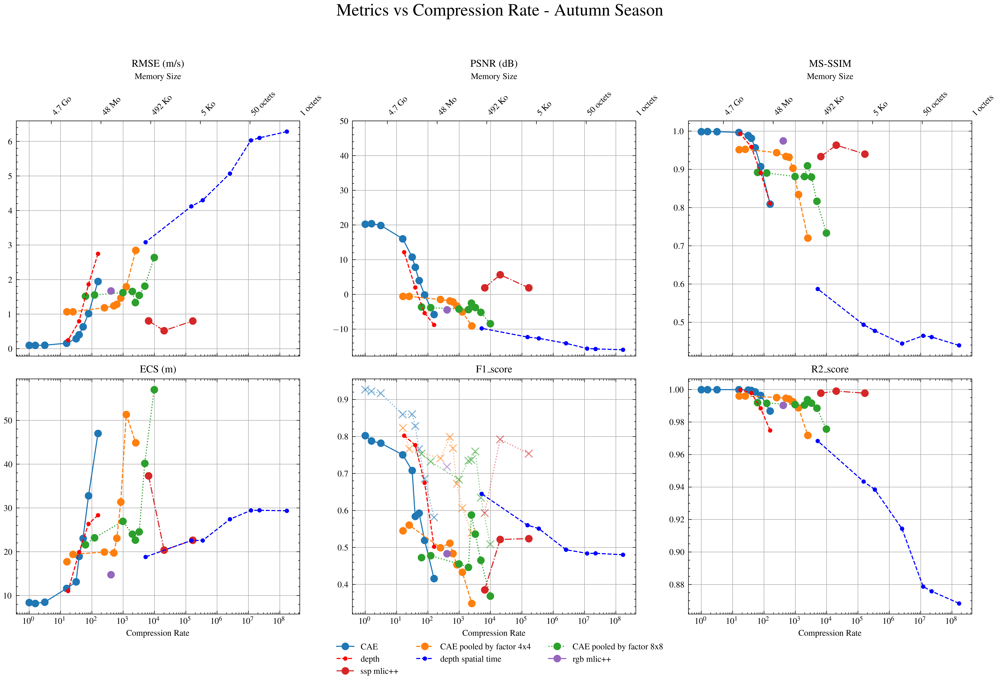


Plotting Winter Season
Available models for winter: ['rgb mlic++', 'ssp mlic++', 'CAE', 'CAE pooled by factor 4x4', 'CAE pooled by factor 8x8']
Available PCA models for winter: ['depth', 'spatial', 'time', 'depth_spatial', 'depth_time', 'spatial_time', 'depth_spatial_time']


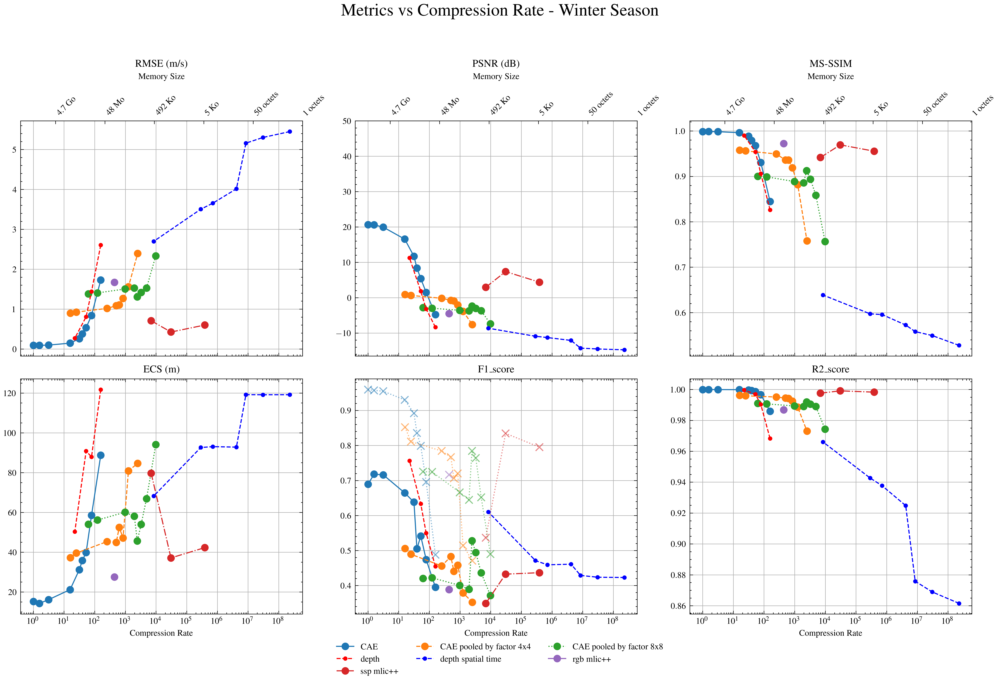


Completed plotting all seasons!


In [ ]:
# =============================================================================
# PLOT FIGURES FOR ALL SEASONS
# =============================================================================

import numpy as np
import matplotlib.pyplot as plt

# Use science style
plt.style.use(["science", "ieee"])

# List of metrics with units
metrics = {
    "RMSE": "m/s",
    "PSNR": "dB",
    "MS-SSIM": None,
    "ECS": "m",
    "F1_score": None,
    "R2_score": None
}

plot_cae = True
plot_compressai = True
plot_PCA = True
plot_filtered = True

# Models and PCA models to plot
models = ['CAE',
 'CAE pooled by factor 4x4',
 'CAE pooled by factor 8x8',
 'ssp mlic++',
 'rgb mlic++']

seasoned_pca_models = ['depth',
                       'depth_spatial_time'] #'spatial', 'time', 'depth_spatial', 'depth_time', 'spatial_time',

# Available seasons
seasons = ['all', 'spring', 'summer', 'autumn', 'winter']

# Loop over each season
for season in seasons:
    print(f"\n{'='*60}")
    print(f"Plotting {season.title()} Season")
    print(f"{'='*60}")
    
    # Extract data for the current season
    if season in model_metrics:
        season_model_metrics = model_metrics[season]
        print(f"Available models for {season}: {list(season_model_metrics.keys())}")
    else:
        print(f"Season '{season}' not found in model_metrics")
        season_model_metrics = {}
        continue
    
    if season in pca_all_metrics:
        season_pca_metrics = pca_all_metrics[season]
        print(f"Available PCA models for {season}: {list(season_pca_metrics.keys())}")
    else:
        print(f"Season '{season}' not found in pca_all_metrics")
        season_pca_metrics = {}
    
    # Skip if no data available for this season
    if not season_model_metrics and not season_pca_metrics:
        print(f"No data available for {season} season, skipping...")
        continue
    
    # Set up the figure
    n_metrics = len(metrics)
    ncols = 3
    nrows = int(np.ceil(n_metrics / ncols))
    
    # Calculate the number of legend rows based on total entries and columns
    total_legend_entries = len(season_model_metrics) + len(season_pca_metrics)
    ncol_legend = 5  # Legend columns
    legend_rows = int(np.ceil(total_legend_entries / ncol_legend))
    
    # Add extra height for legend rows (0.4 inches per legend row)
    extra_height_for_legend = 0.6 * legend_rows
    
    # Adjust figure height to account for legend rows
    fig, axes = plt.subplots(nrows, ncols, figsize=(13, 3.8 * nrows + extra_height_for_legend), sharex=True)
    axes = axes.flatten()
    
    # Use a qualitative colormap with enough distinct colors
    colors = plt.cm.tab10.colors if len(models) <= 10 else plt.cm.tab20.colors
    
    # Collect handles and labels for the legend
    handles, labels = [], []
    
    # Plot each metric
    for idx, (metric, unit) in enumerate(metrics.items()):
        ax = axes[idx]
        filtered_lines = []
        filtered_labels = []
        
        # Plot model data
        for i, model in enumerate(models):
            if model in season_model_metrics:
                if (plot_cae and model.startswith("CAE")) or (plot_compressai and not model.startswith("CAE")):
                    cr_values = sorted(season_model_metrics[model].keys())
                    x = cr_values
                    y = [season_model_metrics[model][cr][metric] for cr in x]
                    line, = ax.plot(x, y, label=model, marker='o', color=colors[i % len(colors)])
                    if idx == 0:  # Collect legend items only once
                        handles.append(line)
                        labels.append(model)
                    
                    # --- Add Filtered_F1_score if metric is F1_score ---
                    if metric == "F1_score" and plot_filtered:
                        y_filt = [season_model_metrics[model][cr].get("Filtered_F1_score", np.nan) for cr in x]
                        filt_line, = ax.plot(
                            x, y_filt,
                            label=f"{model} (filtered)",
                            marker='x',
                            color=colors[i % len(colors)],
                            alpha=0.55,
                            linestyle=':',
                            markersize=7
                        )
                        if idx == 0:  # Only add to main legend once
                            filtered_lines.append(filt_line)
                            filtered_labels.append(f"{model} (filtered)")
        
        # Add PCA data to the plots
        if plot_PCA:
            for pca_model in seasoned_pca_models:
                if pca_model in season_pca_metrics:
                    cr_season_pca_metrics = {}
                    
                    for val in season_pca_metrics[pca_model].values():
                        cr_value = val['CR']
                        cr_season_pca_metrics[cr_value] = val
                    
                    cr_values = list(cr_season_pca_metrics.keys())
                    y_values = [cr_season_pca_metrics[cr][metric] for cr in cr_values]
                    label = pca_model.replace("_", " ")
                    line, = ax.plot(cr_values, y_values, label=label, linestyle="--", marker='.')
                    if idx == 0:
                        handles.append(line)
                        labels.append(label)
        
        ax.set_xscale("log")
        title = f"{metric} ({unit})" if unit else metric
        ax.set_title(title)
        ax.grid(True)
        if metric == "PSNR":
            ax.set_ylim(top=50)
        
        # Add primary x-axis label only for bottom row
        if idx // ncols == nrows - 1:
            ax.set_xlabel("Compression Rate")
        
        # Add secondary x-axis with memory size for top row subplots
        if idx // ncols == 0:
            # Create secondary x-axis
            ax2 = ax.twiny()
            ax2.set_xscale("log")
            ax2.set_xlim(ax.get_xlim())
            
            # Get current ticks and convert to memory sizes
            cr_ticks = ax.get_xticks()
            memory_labels = [cr_to_memory_size(cr) for cr in cr_ticks if cr >=1]
            
            # Set the ticks and labels for secondary axis
            ax2.set_xticks(cr_ticks[cr_ticks >=1])
            ax2.set_xticklabels(memory_labels, rotation=45, ha='left')
            ax2.set_xlabel("Memory Size", labelpad=10)
            
            # Style the secondary axis
            ax2.tick_params(axis='x', which='major', labelsize=8)
        
        # Add legend for filtered lines only in F1_score subplot
        if metric == "F1_score" and filtered_lines:
            ax.legend(filtered_lines, filtered_labels, loc="lower left", fontsize=6.5, frameon=True)
    
    # Hide unused subplots (if any)
    for j in range(n_metrics, len(axes)):
        fig.delaxes(axes[j])
    
    # Sort and zip handles and labels
    sorted_handles_labels = sorted(zip(labels, handles), key=lambda x: x[0])  # Sort by label alphabetically
    
    # Parameters for legend layout
    nrow = 3
    ncol = 3
    
    labels_sorted = np.array(sorted_handles_labels)[:,0]
    handles_sorted = np.array(sorted_handles_labels)[:,1]
    
    handles_reordered = reorder_rowwise(list(handles_sorted), ncol)
    labels_reordered = reorder_rowwise(list(labels_sorted), ncol)
    
    bottom_margin = 0.01 + 0.03 * legend_rows
    
    fig.suptitle(f"Metrics vs Compression Rate - {season.title()} Season", fontsize=16)
    fig.tight_layout(rect=[0, bottom_margin, 1, 0.95])
    
    # Keep the global legend for all curves, sorted by name
    fig.legend(
        handles_reordered, 
        labels_reordered, 
        loc='lower center',
        ncol=ncol,
        bbox_to_anchor=(0.5, bottom_margin/2)  # Adjust anchor point based on margin
    )
    
    plt.show()
    
    # Clear handles and labels for next season
    handles, labels = [], []

print(f"\n{'='*60}")
print("Completed plotting all seasons!")
print(f"{'='*60}")

In [ ]:
column_width = 25
metrics = ["RMSE", "PSNR", "MS-SSIM", "ECS", "MAE", "mean_error_n_min_max", "F1_score", "R2_score", "bpp"]

# Pick the highest CR for each model
selected_cr = {}
for name in season_model_metrics.keys():
    crs = list(season_model_metrics[name].keys())
    if crs:
        selected_cr[name] = max(crs)
    else:
        selected_cr[name] = None

print(f"Metrics Table for {selected_season.title()} Season")
print("=" * 50)
header = f'{"Metric":{column_width}s} | ' + ' | '.join([f'{name:{column_width}s}' for name in season_model_metrics.keys()]) + ' |'
print('-' * len(header))
print(header)
print('-' * len(header))

for metric in metrics:
    print(f'{metric:{column_width}s}', end=' | ')
    for name in season_model_metrics.keys():
        cr = selected_cr[name]
        if cr is None:
            value = float('nan')
        elif metric == "bpp":
            value = season_model_metrics[name][cr].get("bits_per_element", float('nan'))
        else:
            value = season_model_metrics[name][cr].get(metric, float('nan'))
        print(f'{value:{column_width}.3f}', end=' | ')
    print()
print('-' * len(header))

Metrics Table for Winter Season
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------
Metric                    | rgb mlic++                | ssp mlic++                | CAE                       | CAE pooled by factor 4x4  | CAE pooled by factor 8x8  |
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------
RMSE                      |                     1.672 |                     0.603 |                     1.731 |                     2.395 |                     2.336 | 
PSNR                      |                    -4.465 |                     4.397 |                    -4.767 |                    -7.586 |                    -7.370 | 
MS-SSIM                   |                     0.972 |                     0.956 |                     0.845 |               